## 1) Importamos librerias y cargamos los archivos

In [30]:
#Importamos las librerias
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import datetime as datetime
from shapely.geometry import Point
from matplotlib.colors import ListedColormap

%matplotlib inline
plt.style.use('default')
sns.set(style="whitegrid")

In [2]:
#Cargamos el csv
propiedades=pd.read_csv('train.csv')

In [4]:
#Cargamos el .shp de México
url="MexicoPoly0295/MexicoPoly02.shp"
mex=gpd.read_file(url)

In [5]:
#Cargamos el .shp de los municipios de México
url_municipio="muni_2012gw/Muni_2012gw.shp"
mex_municipio=gpd.read_file(url_municipio)

In [96]:
#Establecemos las longitudes extremas de México
lat_maxima=32.718333
lat_minima=14.540833
lng_maxima=-86.710000
lng_minima=-118.366666

### 1.1) Analizamos el set de datos y los .shp de México

In [7]:
#Vista previa del set de Propiedades
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,idzona,lat,lng,fecha,gimnasio,usosmultiples,piscina,escuelascercanas,centroscomercialescercanos,precio
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,23533.0,NaN,NaN,2015-08-23 00:00:00,0.0,0.0,0.0,0.0,0.0,2273000.0
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,24514.0,19.310205,-99.227655,2013-06-28 00:00:00,0.0,0.0,0.0,1.0,1.0,3600000.0
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,48551.0,NaN,NaN,2015-10-17 00:00:00,0.0,0.0,0.0,0.0,0.0,1200000.0
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,53666.0,19.301890,-99.688015,2012-03-09 00:00:00,0.0,0.0,0.0,1.0,1.0,650000.0
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,47835.0,NaN,NaN,2016-06-07 00:00:00,0.0,0.0,0.0,0.0,0.0,1150000.0


In [8]:
#Vista previa del .shp de México
mex.head()

,id,country,name,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254..."
1,2589601,MEX,Baja California,Baja California,Baja California,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449..."
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91...."
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872..."


In [9]:
#Vista previa del .shp de los municipios de México
mex_municipio.head()

,CVE_ENT,CVE_MUN,NOM_MUN,OID_1,cov_,cov_id,geometry
0,01,005,Jesús María,1,1,2,POLYGON ((-102.3356775711372 22.05066521496476...
1,01,011,San Francisco de los Romo,2,2,3,POLYGON ((-102.1527236904711 22.08962165184315...
2,01,001,Aguascalientes,3,3,4,POLYGON ((-102.1064122399267 22.06035441303122...
3,01,008,San José de Gracia,4,4,5,POLYGON ((-102.4561096056242 22.32323223869171...
4,01,007,Rincón de Romos,5,5,6,"POLYGON ((-102.226841597708 22.37392855834552,..."


In [10]:
#Renombramos columnas para poder mergear luego
mex_municipio.rename(columns={'CVE_ENT':'provincia','NOM_MUN':'ciudad'},inplace=True)

In [11]:
#Renombramos columnas y el nombre de algunas provincias para que tengan el mismo nombre que en el set de Datos
mex['locname'].replace({'Baja California':'Baja California Norte','Coahuila de Zaragoza':'Coahuila','Estado de México':'Edo. de México','Ciudad de México':'Distrito Federal','Michoacán de Ocampo':'Michoacán','Veracruz de Ignacio de la Llave':'Veracruz','San Luis Potosí':'San luis Potosí'},inplace=True)
mex.rename(columns={'locname':'provincia'},inplace=True)

In [14]:
#Observamos el tipo de dato que es cada columna y,así mismo, la cantidad de memoria que ocupa
propiedades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240000 entries, 0 to 239999
Data columns (total 23 columns):
id                            240000 non-null int64
titulo                        234613 non-null object
descripcion                   238381 non-null object
tipodepropiedad               239954 non-null object
direccion                     186928 non-null object
ciudad                        239628 non-null object
provincia                     239845 non-null object
antiguedad                    196445 non-null float64
habitaciones                  217529 non-null float64
garages                       202235 non-null float64
banos                         213779 non-null float64
metroscubiertos               222600 non-null float64
metrostotales                 188533 non-null float64
idzona                        211379 non-null float64
lat                           116512 non-null float64
lng                           116512 non-null float64
fecha                         240

In [18]:
#Cambiamos el tipo de dato de algunas columnas para bajar el uso de memoria
propiedades['antiguedad']=propiedades['antiguedad'].astype('int32',errors='ignore')
propiedades['habitaciones']=propiedades['habitaciones'].astype('int32',errors='ignore')
propiedades['banos']=propiedades['banos'].astype('int32',errors='ignore')
propiedades['gimnasio']=propiedades['gimnasio'].astype('int32',errors='ignore')
propiedades['usosmultiples']=propiedades['usosmultiples'].astype('int32',errors='ignore')
propiedades['piscina']=propiedades['piscina'].astype('int32',errors='ignore')
propiedades['escuelascercanas']=propiedades['escuelascercanas'].astype('int32',errors='ignore')
propiedades['centroscomercialescercanos']=propiedades['centroscomercialescercanos'].astype('int32',errors='ignore')

In [22]:
#Verificamos que efectivamente se hicieron los cambios
propiedades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240000 entries, 0 to 239999
Data columns (total 23 columns):
id                            240000 non-null int64
titulo                        234613 non-null object
descripcion                   238381 non-null object
tipodepropiedad               239954 non-null object
direccion                     186928 non-null object
ciudad                        239628 non-null object
provincia                     239845 non-null object
antiguedad                    196445 non-null float64
habitaciones                  217529 non-null float64
garages                       202235 non-null float64
banos                         213779 non-null float64
metroscubiertos               222600 non-null float64
metrostotales                 188533 non-null float64
idzona                        211379 non-null float64
lat                           116512 non-null float64
lng                           116512 non-null float64
fecha                         240

In [23]:
#Verificamos si hay algún elemento nulo en las columnas, lo cual efectivamente es cierto
propiedades.isnull().any()

id                            False
titulo                         True
descripcion                    True
tipodepropiedad                True
direccion                      True
ciudad                         True
provincia                      True
antiguedad                     True
habitaciones                   True
garages                        True
banos                          True
metroscubiertos                True
metrostotales                  True
idzona                         True
lat                            True
lng                            True
fecha                         False
gimnasio                      False
usosmultiples                 False
piscina                       False
escuelascercanas              False
centroscomercialescercanos    False
precio                        False
dtype: bool

In [24]:
#Vemos cuantos elementos nulos hay por columna
propiedades.isnull().sum()

id                                 0
titulo                          5387
descripcion                     1619
tipodepropiedad                   46
direccion                      53072
ciudad                           372
provincia                        155
antiguedad                     43555
habitaciones                   22471
garages                        37765
banos                          26221
metroscubiertos                17400
metrostotales                  51467
idzona                         28621
lat                           123488
lng                           123488
fecha                              0
gimnasio                           0
usosmultiples                      0
piscina                            0
escuelascercanas                   0
centroscomercialescercanos         0
precio                             0
dtype: int64

## 2) Fechas

Comenzamos analizando las fechas, como se dice en el enunciado del trabajo, las fechas comprendidas son desde el 2012 hasta el 2016, la idea es verificar que efectivamente es cierto y luego, analizar de manera mas minuciosa para ver que conclusiones se pueden obtener

In [25]:
#Hacemos la conversión de fechas
propiedades['Fecha']=pd.to_datetime(propiedades['fecha'])
propiedades.drop(columns={'fecha'},inplace=True)

In [26]:
#Generamos las columnas de Año, Mes y Dia
propiedades['Anio']=propiedades['Fecha'].dt.year
propiedades['Mes']=propiedades['Fecha'].dt.month
propiedades['Dia']=propiedades['Fecha'].dt.day
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,gimnasio,usosmultiples,piscina,escuelascercanas,centroscomercialescercanos,precio,Fecha,Anio,Mes,Dia
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,0,0,0,0,0,2273000.0,2015-08-23,2015,8,23
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,0,0,0,1,1,3600000.0,2013-06-28,2013,6,28
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,0,0,0,0,0,1200000.0,2015-10-17,2015,10,17
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,0,0,0,1,1,650000.0,2012-03-09,2012,3,9
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,0,0,0,0,0,1150000.0,2016-06-07,2016,6,7


In [27]:
#Creamos una función que según el mes y el dia, nos devuelve en que estación se encuentra
def fechaEstacion(mes,dia):
    if((mes==1) | (mes==2)):
        return 'Invierno'
    if(mes==3):
        if(dia<21):
            return 'Invierno'
        if(dia>=21):
            return 'Primavera'
    if((mes==4) | (mes==5)):
        return 'Primavera'
    if(mes==6):
        if(dia<21):
            return 'Primavera'
        if(dia>=21):
            return 'Verano'
    if((mes==7) | (mes==8)):
        return 'Verano'
    if(mes==9):
        if(dia<21):
            return 'Verano'
        if(dia>=21):
            return 'Otonio'
    if((mes==10) | (mes==11)):
        return 'Otonio'
    if(mes==12):
        if(dia<21):
            return 'Otonio'
        if(dia>=21):
            return 'Invierno'

In [28]:
#Aplicamos la función en cuestión
propiedades['Estacion']=propiedades.apply(lambda x: fechaEstacion(x['Mes'],x['Dia']),axis=1)
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,usosmultiples,piscina,escuelascercanas,centroscomercialescercanos,precio,Fecha,Anio,Mes,Dia,Estacion
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,0,0,0,0,2273000.0,2015-08-23,2015,8,23,Verano
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,0,0,1,1,3600000.0,2013-06-28,2013,6,28,Verano
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,0,0,0,0,1200000.0,2015-10-17,2015,10,17,Otonio
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,0,0,1,1,650000.0,2012-03-09,2012,3,9,Invierno
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,0,0,0,0,1150000.0,2016-06-07,2016,6,7,Primavera


In [22]:
propiedades['difmetros']=propiedades['metrostotales']-propiedades['metroscubiertos']
propiedades.head()

,id,titulo,descripcion,tipodepropiedad,direccion,ciudad,provincia,antiguedad,habitaciones,garages,...,usosmultiples,piscina,escuelascercanas,centroscomercialescercanos,precio,Fecha,Anio,Mes,Dia,difmetros
0,254099,depto. tipo a-402,"depto. interior de 80.15m2, consta de sala com...",Apartamento,Avenida Division del Norte 2005,Benito Juárez,Distrito Federal,NaN,2.0,1.0,...,0.0,0.0,0.0,0.0,2273000.0,2015-08-23,2015,8,23,0.0
1,53461,condominio horizontal en venta,"<p>entre sonora y guerrero, atr&aacute;s del h...",Casa en condominio,AV. MEXICO,La Magdalena Contreras,Distrito Federal,10.0,3.0,2.0,...,0.0,0.0,1.0,1.0,3600000.0,2013-06-28,2013,6,28,-88.0
2,247984,casa en venta urbi 3 recamaras tonala,descripcion \nla mejor ubicacion residencial e...,Casa,Urbi Tonala,Tonalá,Jalisco,5.0,3.0,2.0,...,0.0,0.0,0.0,0.0,1200000.0,2015-10-17,2015,10,17,22.0
3,209067,casa sola en toluca zinacantepec con credito i...,casa en privada con caseta de vigilancia casas...,Casa,IGNACIO MANUEL ALTAMIRANO 128,Zinacantepec,Edo. de México,1.0,2.0,1.0,...,0.0,0.0,1.0,1.0,650000.0,2012-03-09,2012,3,9,4.0
4,185997,paseos del sol,bonito departamento en excelentes condiciones ...,Apartamento,PASEOS DEL SOL,Zapopan,Jalisco,10.0,2.0,1.0,...,0.0,0.0,0.0,0.0,1150000.0,2016-06-07,2016,6,7,0.0


### 2.1) Años

Text(0,0.5,'Años')

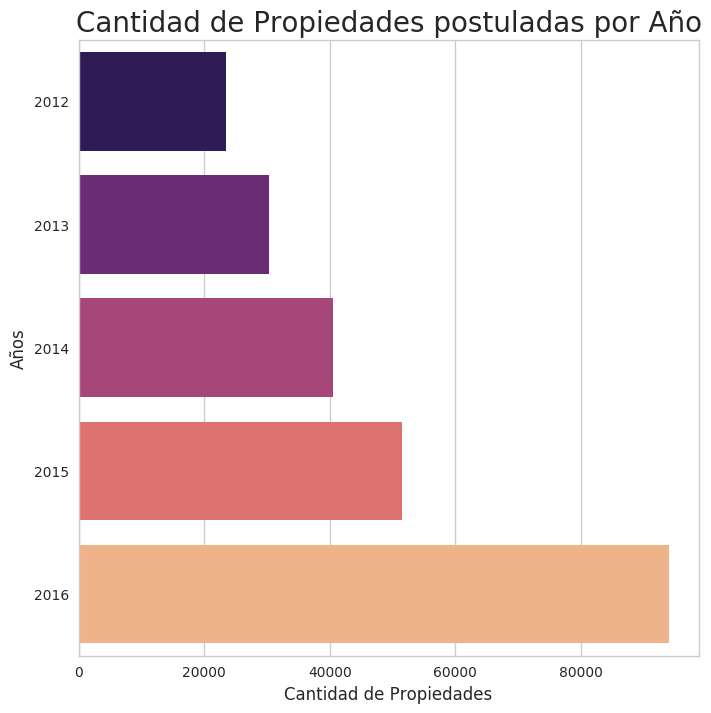

In [31]:
cantidad_prop_anio=propiedades['Anio'].value_counts().sort_index()
plt.subplots(figsize=(8,8))
grafico_anio=sns.barplot(x=cantidad_prop_anio.values,y=cantidad_prop_anio.index,orient='h',palette='magma')
grafico_anio.set_title("Cantidad de Propiedades postuladas por Año",fontsize=20)
grafico_anio.set_xlabel("Cantidad de Propiedades",fontsize=12)
grafico_anio.set_ylabel("Años",fontsize=12)

Se puede observar que con el correr de los años la cantidad de propiedades aumentaron considerablemente, asi mismo, veificamos que las fechas son efectivamente desde el 2012 al 2016, no habiendo ningun tipo de anomalía en esta cuestión

### 2.2) Mes

Text(0,0.5,'Cantidad de Propiedades')

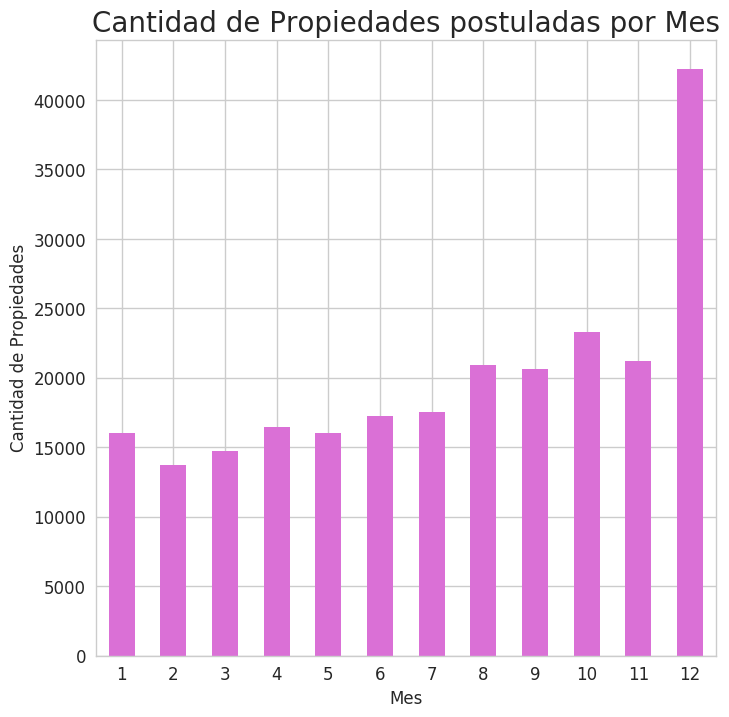

In [32]:
cantidad_prop_mes=propiedades['Mes'].value_counts().sort_index()
grafico_mes=cantidad_prop_mes.plot(kind='bar',color='orchid',fontsize=12,figsize=(8,8),rot=0)
grafico_mes.set_title("Cantidad de Propiedades postuladas por Mes",fontsize=20)
grafico_mes.set_xlabel("Mes",fontsize=12)
grafico_mes.set_ylabel("Cantidad de Propiedades",fontsize=12)

En cuanto a los meses, se puede ver que en el mes de diciembre es donde mayor cantidad de propiedades fue en diciembre mientras que la de menos cantidad es la de febrero. También se puede ver que hay poca actividad en los meses de Junio y Julio, lo cual no parece extraño ya que, al ser propiedades ubicadas en México, en esa fecha es verano, lo cual tiene sentido

### 2.3) Días

ACLARACIÓN: Para los días solamente tomamos 30 días, el dia 31 decidimos no incluirlo ya que no se puede analizar con profundidad al no tener todos los datos como los otros dias

Text(0,0.5,'Cantidad de Propiedades')

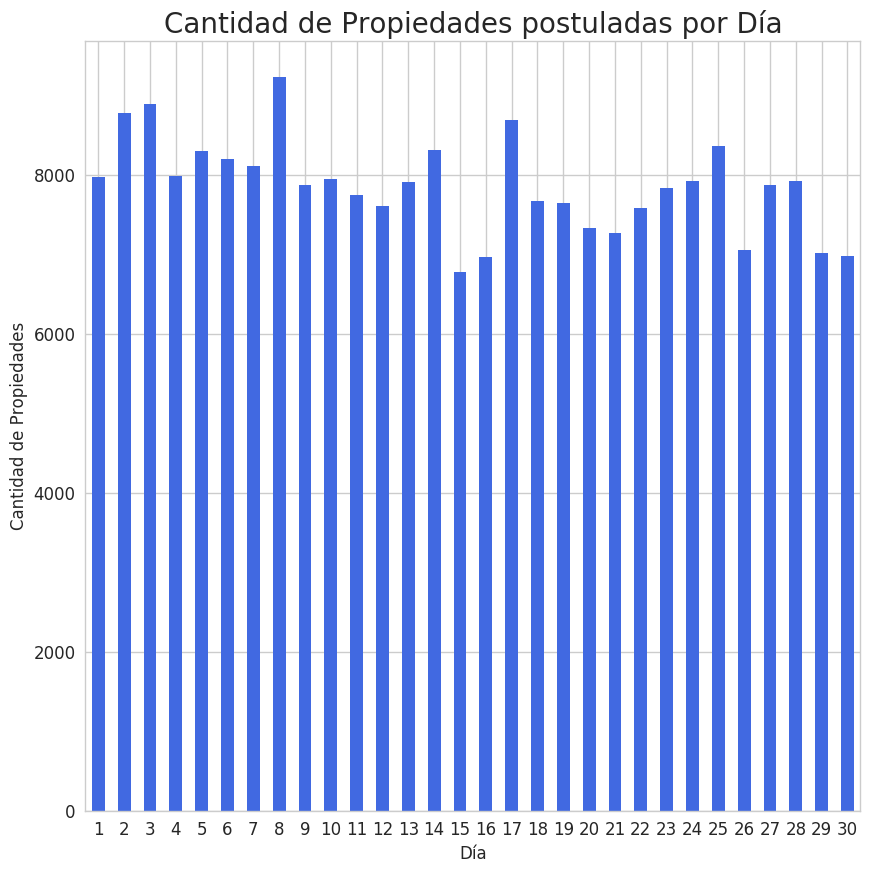

In [33]:
cantidad_prop_dia=propiedades['Dia'].value_counts().sort_index().head(30)
grafico_dia=cantidad_prop_dia.plot(kind='bar',color='royalblue',fontsize=12,figsize=(10,10),rot=0)
grafico_dia.set_title("Cantidad de Propiedades postuladas por Día",fontsize=20)
grafico_dia.set_xlabel("Día",fontsize=12)
grafico_dia.set_ylabel("Cantidad de Propiedades",fontsize=12)

Podemos observar que a mitad de mes, mas especificamente los días 15 y 16 son los que menor cantidad de propiedades hubo. Cabe aclarar que el día 31 fue descartado por el simple hecho de que no todos los meses tienen dicho dia, por lo que se hubiera notado alguna anomalía con dicho número

### 2.4) Relaciones entre Fechas

#### 2.4.1) Relación entre Año y Mes

In [41]:
fecha_propiedades=propiedades[['Anio','Mes','Dia']].copy()
fecha_propiedades['Valor']=1
anio_mes=fecha_propiedades.pivot_table(index='Mes',columns='Anio',values='Valor',aggfunc='count')
anio_mes.rename(index={1:'Ene',2:'Feb',3:'Mar',4:'Abr',5:'May',6:'Jun',7:'Jul',8:'Ago',9:'Sep',10:'Oct',11:'Nov',12:'Dic'},inplace=True)
anio_mes

Anio,2012,2013,2014,2015,2016
Mes,,,,,
Ene,1528,1993,2403,4310,5775
Feb,1327,1401,2534,3869,4592
Mar,1103,1734,2916,3957,5022
Abr,1434,1829,2780,3783,6640
May,1857,2000,3071,3696,5438
Jun,1524,2016,3082,3804,6795
Jul,1973,2524,3125,3875,6013
Ago,3971,2374,3583,4526,6443
Sep,2598,3321,3911,4863,5929


[Text(0,0.5,'Ene'),
 Text(0,1.5,'Feb'),
 Text(0,2.5,'Mar'),
 Text(0,3.5,'Abr'),
 Text(0,4.5,'May'),
 Text(0,5.5,'Jun'),
 Text(0,6.5,'Jul'),
 Text(0,7.5,'Ago'),
 Text(0,8.5,'Sep'),
 Text(0,9.5,'Oct'),
 Text(0,10.5,'Nov'),
 Text(0,11.5,'Dic')]

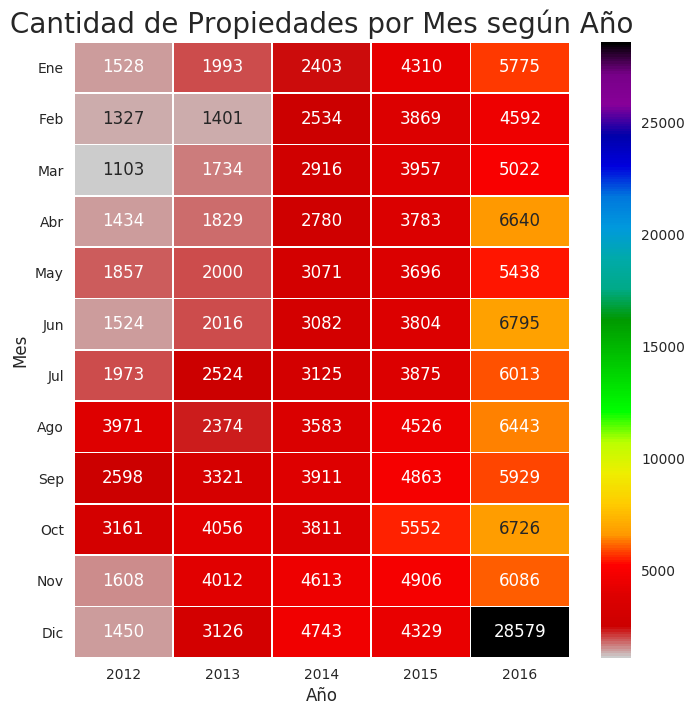

In [42]:
plt.subplots(figsize=(8,8))
grafico_anio_mes=sns.heatmap(anio_mes,linewidths=.5,fmt="d",annot=True,cmap="nipy_spectral_r")
grafico_anio_mes.set_title("Cantidad de Propiedades por Mes según Año",fontsize=20)
grafico_anio_mes.set_xlabel("Año",fontsize=12)
grafico_anio_mes.set_ylabel("Mes",fontsize=12)
grafico_anio_mes.set_yticklabels(grafico_anio_mes.get_yticklabels(),rotation=0)

Se puede observar que en el mes de Diciembre del 2016 es donde hay mayor cantidad de propiedades que fueron puestas a la venta, lo cual concuerda con lo visto anteriormente. Sin embargo, aunque en el 2014 también predomina el mes de Diciembre, en los otros años suele haber un cambio, ya que en el año 2012 el mes que presenta mayor cantidad de propiedades es Agosto, en 2013 el mes de Noviembre y en el 2015 Octubre.

#### 2.4.2) Relación entre Mes y Día

In [43]:
mes_dia=fecha_propiedades.pivot_table(index='Mes',columns='Dia',values='Valor',aggfunc='count')
mes_dia.fillna(0,inplace=True)
mes_dia.drop(columns={31},inplace=True)
mes_dia.rename(index={1:'Ene',2:'Feb',3:'Mar',4:'Abr',5:'May',6:'Jun',7:'Jul',8:'Ago',9:'Sep',10:'Oct',11:'Nov',12:'Dic'},inplace=True)
mes_dia

Dia,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
Mes,,,,,,,,,,,,,,,,,,,,,
Ene,330.0,467.0,943.0,638.0,437.0,476.0,377.0,693.0,613.0,450.0,...,429.0,534.0,673.0,525.0,520.0,511.0,534.0,509.0,667.0,474.0
Feb,640.0,570.0,660.0,459.0,634.0,453.0,453.0,506.0,494.0,485.0,...,435.0,439.0,308.0,458.0,400.0,494.0,610.0,470.0,140.0,0.0
Mar,353.0,400.0,471.0,683.0,428.0,491.0,664.0,828.0,453.0,442.0,...,442.0,507.0,367.0,353.0,449.0,369.0,399.0,613.0,480.0,359.0
Abr,439.0,509.0,507.0,534.0,509.0,437.0,520.0,1676.0,406.0,529.0,...,392.0,697.0,342.0,832.0,599.0,480.0,434.0,553.0,650.0,398.0
May,549.0,610.0,539.0,493.0,407.0,637.0,506.0,520.0,581.0,379.0,...,459.0,454.0,517.0,524.0,494.0,517.0,633.0,595.0,522.0,620.0
Jun,462.0,401.0,695.0,538.0,568.0,701.0,825.0,549.0,889.0,766.0,...,625.0,424.0,493.0,647.0,481.0,494.0,540.0,542.0,380.0,452.0
Jul,600.0,516.0,522.0,602.0,434.0,485.0,506.0,640.0,383.0,618.0,...,456.0,788.0,483.0,629.0,671.0,529.0,540.0,461.0,701.0,567.0
Ago,1030.0,602.0,604.0,455.0,635.0,1109.0,629.0,782.0,632.0,580.0,...,612.0,660.0,685.0,638.0,587.0,687.0,618.0,606.0,681.0,678.0
Sep,572.0,709.0,803.0,835.0,865.0,539.0,858.0,481.0,619.0,590.0,...,563.0,578.0,1121.0,714.0,803.0,889.0,700.0,503.0,608.0,704.0


[Text(0,0.5,'Ene'),
 Text(0,1.5,'Feb'),
 Text(0,2.5,'Mar'),
 Text(0,3.5,'Abr'),
 Text(0,4.5,'May'),
 Text(0,5.5,'Jun'),
 Text(0,6.5,'Jul'),
 Text(0,7.5,'Ago'),
 Text(0,8.5,'Sep'),
 Text(0,9.5,'Oct'),
 Text(0,10.5,'Nov'),
 Text(0,11.5,'Dic')]

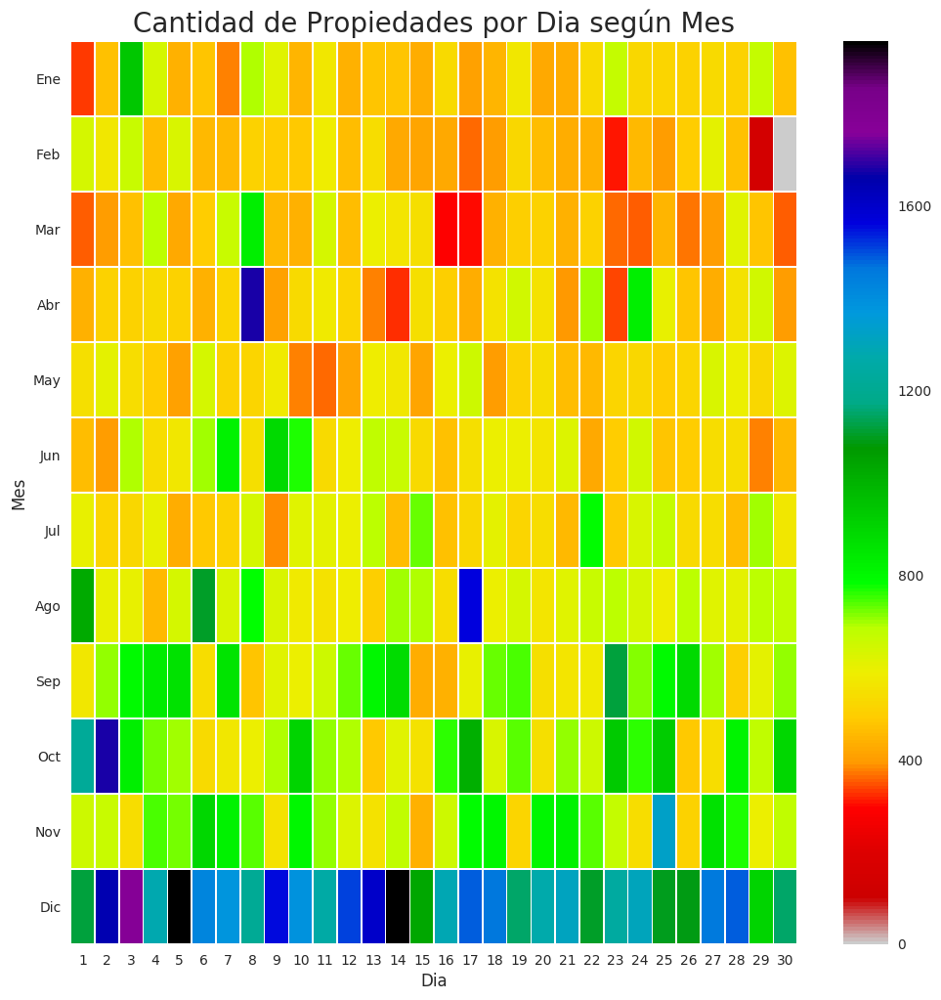

In [44]:
plt.subplots(figsize=(12,12))
grafico_mes_dia=sns.heatmap(mes_dia,linewidths=.5,cmap="nipy_spectral_r")
grafico_mes_dia.set_title("Cantidad de Propiedades por Dia según Mes",fontsize=20)
grafico_mes_dia.set_xlabel("Dia",fontsize=12)
grafico_mes_dia.set_ylabel("Mes",fontsize=12)
grafico_mes_dia.set_yticklabels(grafico_mes_dia.get_yticklabels(),rotation=0)

Podemos ver que sigue imponiendose el mes de Diciembre, y los días 5 como 14 es donde se registran la mayor cantidad de propiedades puestas en venta

### 2.5) Relación de Precio por Año y Mes

In [45]:
precio_anio_mes=propiedades[['Anio','Mes','precio']].copy()
group_precio_anio_mes=precio_anio_mes.pivot_table(index='Mes',columns='Anio',values='precio',aggfunc='mean')
group_precio_anio_mes

Anio,2012,2013,2014,2015,2016
Mes,,,,,
1,1.910287e+06,2.032821e+06,2.194887e+06,2.399791e+06,2.688370e+06
2,1.817815e+06,2.158046e+06,2.327649e+06,2.367704e+06,2.695540e+06
3,1.966355e+06,2.092788e+06,2.268509e+06,2.602794e+06,2.807389e+06
4,2.167271e+06,2.164533e+06,2.360991e+06,2.520666e+06,2.827183e+06
5,1.899124e+06,2.119536e+06,2.312620e+06,2.643570e+06,2.726720e+06
6,1.930387e+06,2.058968e+06,2.357717e+06,2.734104e+06,2.744906e+06
7,1.827299e+06,2.221331e+06,2.358130e+06,2.779177e+06,2.882330e+06
8,2.116829e+06,2.197108e+06,2.345646e+06,2.654494e+06,2.880278e+06
9,2.092780e+06,2.112627e+06,2.430109e+06,2.778324e+06,2.918304e+06


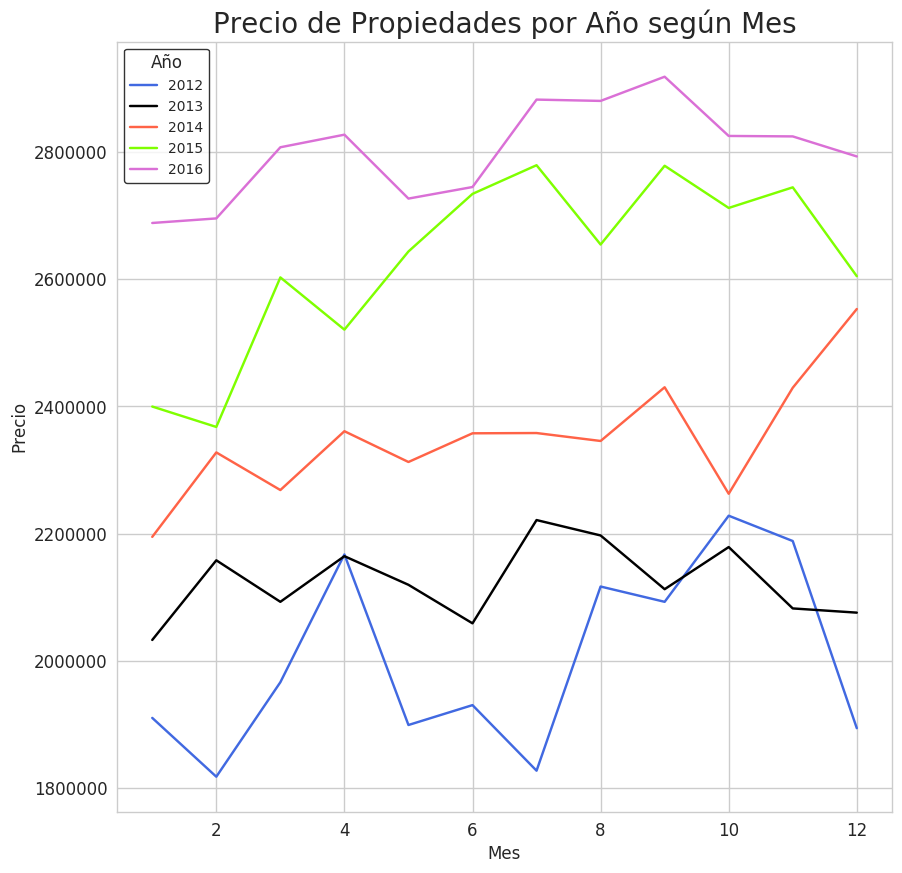

In [46]:
grafico_group_precio_anio_mes=group_precio_anio_mes.plot(kind='line',color=['royalblue','black','tomato','chartreuse','orchid'],figsize=(10,10),fontsize=12)
grafico_group_precio_anio_mes.set_title("Precio de Propiedades por Año según Mes",fontsize=20)
grafico_group_precio_anio_mes.set_xlabel("Mes",fontsize=12)
grafico_group_precio_anio_mes.set_ylabel("Precio",fontsize=12)
leyenda=plt.legend(['2012','2013','2014','2015','2016'],fontsize=10,title='Año',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

Como era de esperarse, en el 2016 es donde los precios son mayores y podemos observar que hay una similitud entre 2016, 2015 y 2014 que el mes donde los precios son mayores fueron en Septiembre, mientras que en el 2012 fue Octubre, superando inclusive al precio de ese mes en el 2013

## 3) Provincias

### 3.1) Cantidad de Propiedades por Provincia

In [47]:
cantidad_propiedades=propiedades['provincia'].value_counts().reset_index()
cantidad_propiedades.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_propiedades

,provincia,cantidad
0,Distrito Federal,58790
1,Edo. de México,41607
2,Jalisco,21238
3,Querétaro,16988
4,Nuevo León,15324
5,Puebla,10421
6,San luis Potosí,8447
7,Yucatán,7928
8,Morelos,7337
9,Veracruz,5762


In [48]:
cantidad_propiedades_provicia=pd.merge(mex,cantidad_propiedades,on='provincia',how='inner')

In [49]:
cantidad_propiedades_provicia.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",1753
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",3220
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",263
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,1126
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",4590


Text(0.5,1,'Cantidad de Propiedades por Estado')

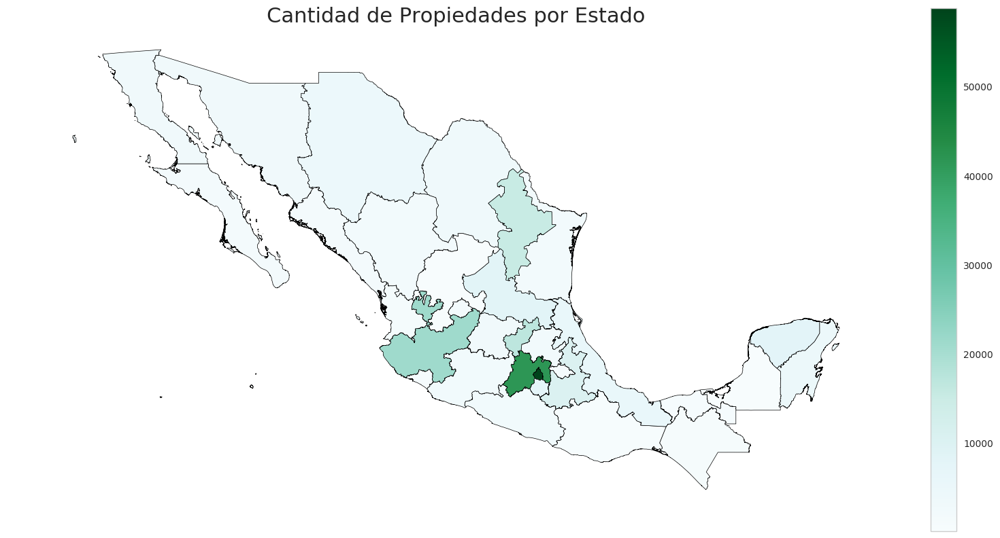

In [50]:
fig, grafico_cantidad_propiedades_provicia = plt.subplots(1, figsize=(20, 10))
cantidad_propiedades_provicia.plot(column='cantidad',cmap='BuGn', edgecolor='black',ax=grafico_cantidad_propiedades_provicia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_propiedades_provicia.axis('off')
grafico_cantidad_propiedades_provicia.set_title("Cantidad de Propiedades por Estado",fontsize=22)

Se puede observar que en la capital de México (Distrito Federal) es dnnde se encuentran la mayor cantidad  de propiedades en venta, seguida por el Estado de México. Luego puede verse que le sigue Jalisco pero ya con una gran diferencia respecto a los otros dos.

### 3.2) Precio por Provincia

In [51]:
precio_provincia=propiedades.groupby(['provincia']).agg({'precio':'mean'})
precio_provincia=precio_provincia.reset_index()
precio_provincia

,provincia,precio
0,Aguascalientes,1.477189e+06
1,Baja California Norte,7.674418e+05
2,Baja California Sur,1.216453e+06
3,Campeche,1.570918e+06
4,Chiapas,1.924126e+06
5,Chihuahua,1.744531e+06
6,Coahuila,1.505305e+06
7,Colima,1.531380e+06
8,Distrito Federal,3.471705e+06
9,Durango,1.210389e+06


In [52]:
precio_provincia_mex=pd.merge(mex,precio_provincia,on='provincia',how='inner')
precio_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,precio
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",1.477189e+06
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",7.674418e+05
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",1.570918e+06
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,1.924126e+06
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",1.744531e+06


Text(0.5,1,'Precio Promedio de Propiedades por Estado')

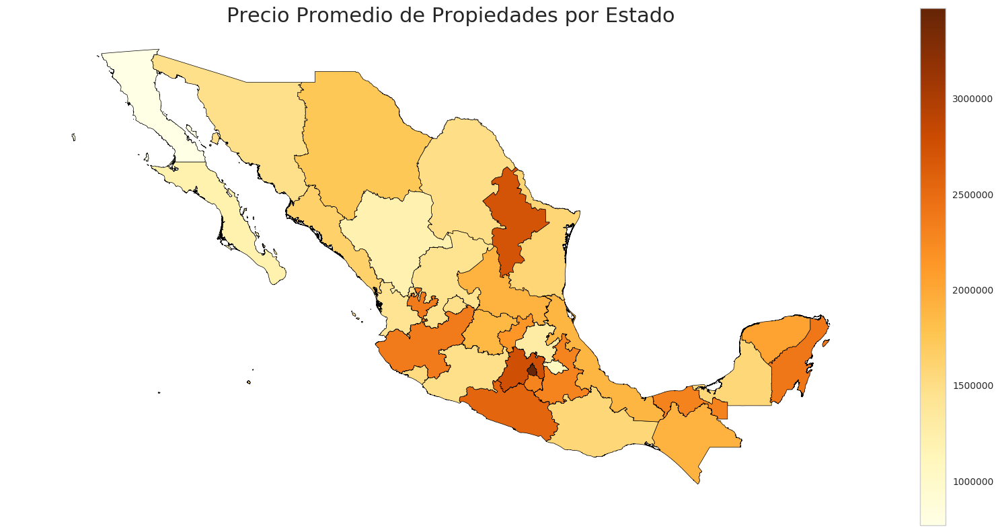

In [54]:
fig, grafico_precio_provincia_mex = plt.subplots(1, figsize=(20, 10))
precio_provincia_mex.plot(column='precio',cmap='YlOrBr', edgecolor='black',ax=grafico_precio_provincia_mex,legend=True,figsize=(30,30),linewidth=0.5)
grafico_precio_provincia_mex.axis('off')
grafico_precio_provincia_mex.set_title("Precio Promedio de Propiedades por Estado",fontsize=22)

Se sigue la tendencia vista en el gráfico anterior, el Distrito Federal es donde se encuentran las propiedades con mayor precio, lo cual tiene sentido ya que estamos hablando de la capital del país. Luego podemos ver que tanto como el Estado de México y Nuevo Leon presentan precios elevados, lo cual resulta peculiar para el segundo ya que, como vimos en el gráfico anterior, no presenta muchas propiedades en venta, por lo cual podemos decir que son las propiedades de Nuevo Leon pueden ser las más costosas.

### 3.3) Tipo de Propiedad por Provincia

In [55]:
#Primero veamos cuales son los tipos de Propiedades más populares
propiedades['tipodepropiedad'].value_counts()

Casa                             141717
Apartamento                       57341
Casa en condominio                19297
Terreno                            9945
Local Comercial                    3055
Oficina comercial                  1741
Bodega comercial                   1406
Edificio                           1396
Terreno comercial                  1326
Casa uso de suelo                   708
Quinta Vacacional                   395
Duplex                              343
Villa                               340
Inmuebles productivos urbanos       200
Rancho                              170
Local en centro comercial           165
Departamento Compartido             141
Otros                               134
Nave industrial                      76
Terreno industrial                   31
Huerta                               20
Lote                                  5
Garage                                1
Hospedaje                             1
Name: tipodepropiedad, dtype: int64

#### 3.3.1) Casa

In [57]:
casa=propiedades[(propiedades['tipodepropiedad']=='Casa')]
cantidad_casa_provincia=casa['provincia'].value_counts().reset_index()
cantidad_casa_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_casa_provincia

,provincia,cantidad
0,Edo. de México,25938
1,Distrito Federal,15812
2,Jalisco,14196
3,Nuevo León,11477
4,Querétaro,11396
5,Puebla,6577
6,Yucatán,6472
7,San luis Potosí,5612
8,Morelos,4626
9,Veracruz,4445


In [58]:
cantidad_casa_provincia_mex=pd.merge(mex,cantidad_casa_provincia,on='provincia',how='left')
cantidad_casa_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",1340
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",2769
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",210
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,903
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",3891


Text(0.5,1,'Cantidad de Casas en Venta por Estado')

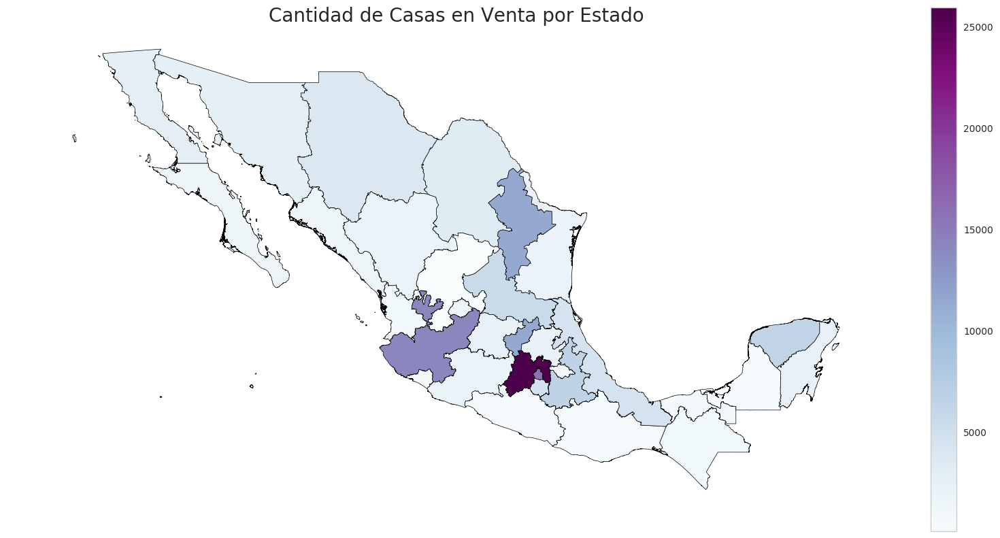

In [59]:
fig, grafico_cantidad_casa_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_casa_provincia_mex.plot(column='cantidad',cmap='BuPu', edgecolor='black',ax=grafico_cantidad_casa_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_casa_provincia.axis('off')
grafico_cantidad_casa_provincia.set_title("Cantidad de Casas en Venta por Estado",fontsize=20)

Podemos observar que en el Estado de México es donde se encuentran la mayor cantidad de casas puestas a la venta, mientras que el Distrito Federal le sigue, lo cual tiene sentido ya que el centro de una Ciudad (y también pais en este caso) se encuentra asociado a que se encuentren mayor cantidad de Apartamentos y/o Edificios, mientras que en la perfisferia suelen encontrarse mayor cantidad de casas, caso similar ocurre en la Argentina.

#### 3.3.2) Apartamento

In [61]:
apartamento=propiedades[(propiedades['tipodepropiedad']=='Apartamento')]
cantidad_apartamento_provincia=apartamento['provincia'].value_counts().reset_index()
cantidad_apartamento_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_apartamento_provincia

,provincia,cantidad
0,Distrito Federal,33839
1,Edo. de México,8297
2,Jalisco,2638
3,Nuevo León,1847
4,San luis Potosí,1686
5,Guerrero,1586
6,Puebla,1522
7,Quintana Roo,1273
8,Querétaro,1084
9,Morelos,859


In [62]:
cantidad_apartamento_provincia_mex=pd.merge(mex,cantidad_apartamento_provincia,on='provincia',how='left')
cantidad_apartamento_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",47
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",196
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",7
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,52
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",41


Text(0.5,1,'Cantidad de Apartamentos en Venta por Estado')

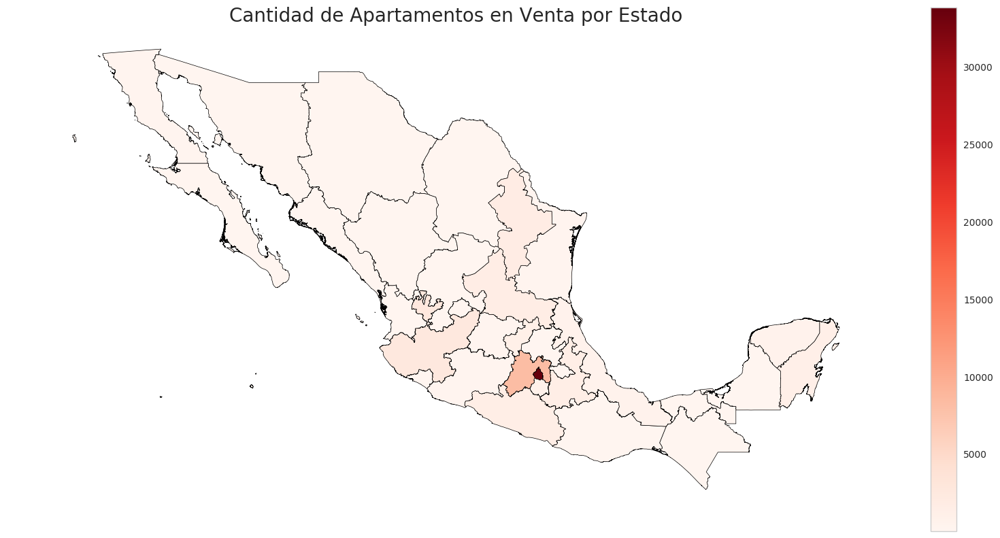

In [63]:
fig, grafico_cantidad_apartamento_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_apartamento_provincia_mex.plot(column='cantidad',cmap='Reds', edgecolor='black',ax=grafico_cantidad_apartamento_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_apartamento_provincia.axis('off')
grafico_cantidad_apartamento_provincia.set_title("Cantidad de Apartamentos en Venta por Estado",fontsize=20)

Como lo habíamos imaginado, en relación a los Apartamentos, el Distrito Federal se impone por mucho con las demas provincias, lo cuál confirma lo que habíamos previsto en el gráfico anterior. Luego le sigue el Estado De México, lo cuál también tiene sentido ya que se encuentra en la perfisferia de la capital del país.

#### 3.3.3) Edificio

In [64]:
edificio=propiedades[(propiedades['tipodepropiedad']=='Edificio')]
cantidad_edificio_provincia=edificio['provincia'].value_counts().reset_index()
cantidad_edificio_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_edificio_provincia

,provincia,cantidad
0,Distrito Federal,616
1,Edo. de México,246
2,Jalisco,65
3,Quintana Roo,61
4,Veracruz,56
5,Nuevo León,52
6,Querétaro,34
7,Chihuahua,27
8,Puebla,26
9,Sinaloa,17


In [65]:
cantidad_edificio_provincia_mex=pd.merge(mex,cantidad_edificio_provincia,on='provincia',how='left')
cantidad_edificio_provincia_mex.fillna(0,inplace=True)
cantidad_edificio_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",6.0
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",0.0
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",1.0
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,13.0
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",27.0


Text(0.5,1,'Cantidad de Edificios en Venta por Estado')

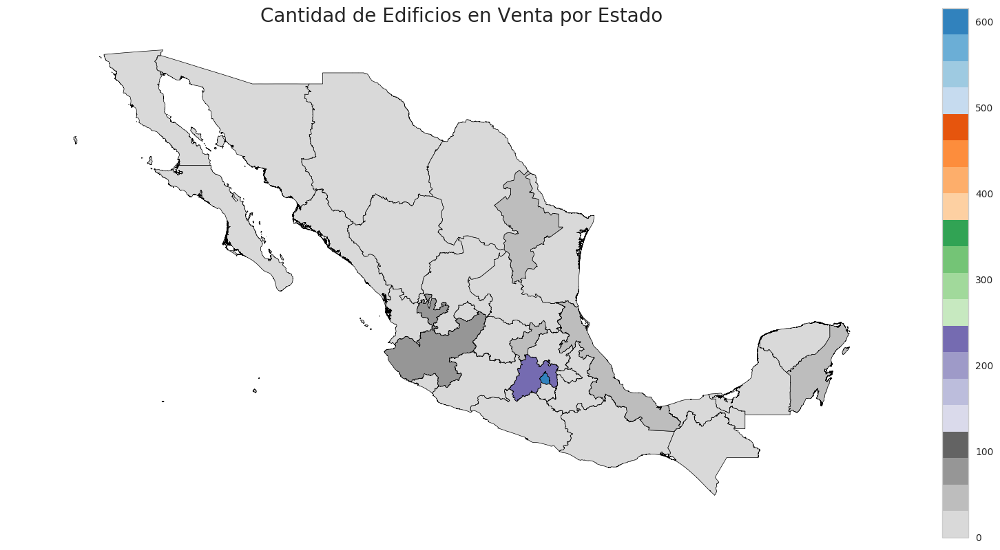

In [66]:
fig, grafico_cantidad_edificio_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_edificio_provincia_mex.plot(column='cantidad',cmap='tab20c_r', edgecolor='black',ax=grafico_cantidad_edificio_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_edificio_provincia.axis('off')
grafico_cantidad_edificio_provincia.set_title("Cantidad de Edificios en Venta por Estado",fontsize=20)

Sigue con la tendencia vista en los Apartamentos, predomina el Distrito Federal, seguido pero desde muy lejos por el Estado de México.

#### 3.3.4) Terreno

In [67]:
terreno=propiedades[(propiedades['tipodepropiedad']=='Terreno')]
cantidad_terreno_provincia=terreno['provincia'].value_counts().reset_index()
cantidad_terreno_provincia.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_terreno_provincia

,provincia,cantidad
0,Distrito Federal,1677
1,Jalisco,1237
2,Querétaro,1223
3,Edo. de México,1156
4,Nuevo León,624
5,Puebla,603
6,Veracruz,422
7,San luis Potosí,390
8,Quintana Roo,284
9,Yucatán,250


In [68]:
cantidad_terreno_provincia_mex=pd.merge(mex,cantidad_terreno_provincia,on='provincia',how='left')
cantidad_terreno_provincia_mex.fillna(0,inplace=True)
cantidad_terreno_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",86
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",24
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",20
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,100
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",230


Text(0.5,1,'Cantidad de Terrenos en Venta por Estado')

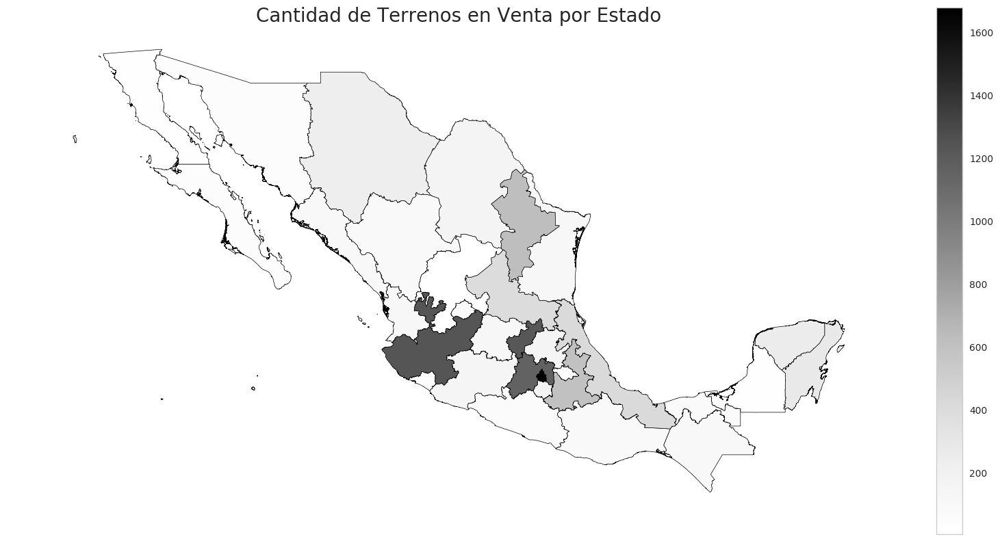

In [69]:
fig, grafico_cantidad_terreno_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_terreno_provincia_mex.plot(column='cantidad',cmap='Greys', edgecolor='black',ax=grafico_cantidad_terreno_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_terreno_provincia.axis('off')
grafico_cantidad_terreno_provincia.set_title("Cantidad de Terrenos en Venta por Estado",fontsize=20)

En este caso, resulta extraño que la mayor cantidad de Terrenos puestos en venta se encuentren en el Distito Federal pero, a la vez, no es extraño en lo absoluto, debido a que tiene sentido que se quiera vender el Terreno, ya que puede ser vendido a ciertas empresas que lo utilizarían para realizar tanto Apartamentos como Edificios o tambien para ser utilizado como Oficinas.

#### 3.3.5) Local Comercial

In [74]:
local_comercial=propiedades[(propiedades['tipodepropiedad']=='Local Comercial')]
cantidad_local_comercial=local_comercial['provincia'].value_counts().reset_index()
cantidad_local_comercial.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_local_comercial

,provincia,cantidad
0,Distrito Federal,471
1,Nuevo León,421
2,Jalisco,397
3,Edo. de México,292
4,Querétaro,235
5,Chihuahua,223
6,Puebla,110
7,San luis Potosí,102
8,Yucatán,98
9,Quintana Roo,90


In [75]:
cantidad_local_comercial_provincia_mex=pd.merge(mex,cantidad_local_comercial,on='provincia',how='left')
cantidad_local_comercial_provincia_mex.fillna(0,inplace=True)
cantidad_local_comercial_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",31
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",17
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",7
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,16
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",223


Text(0.5,1,'Cantidad de Locales Comerciales en Venta por Estado')

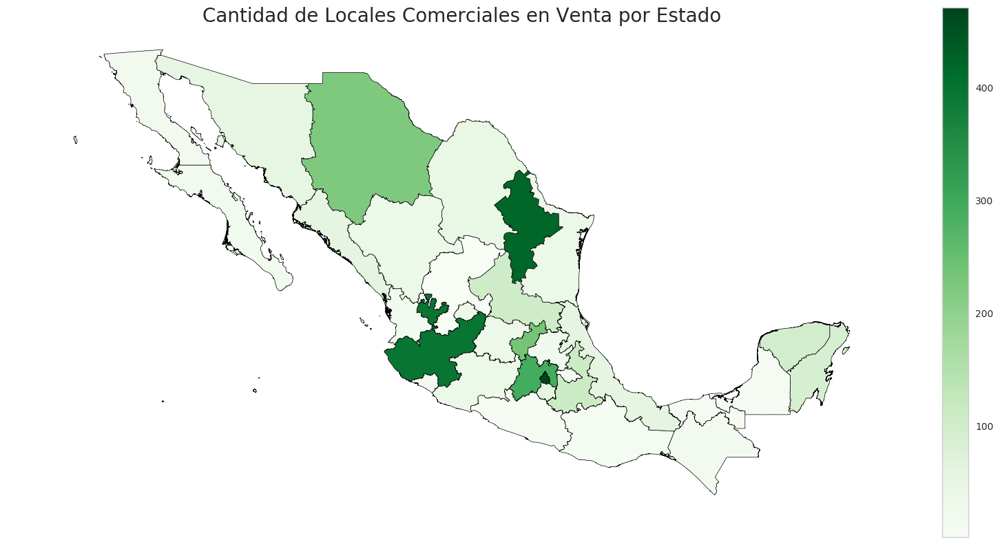

In [76]:
fig, grafico_cantidad_local_comercial_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_local_comercial_provincia_mex.plot(column='cantidad',cmap='Greens', edgecolor='black',ax=grafico_cantidad_local_comercial_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_local_comercial_provincia.axis('off')
grafico_cantidad_local_comercial_provincia.set_title("Cantidad de Locales Comerciales en Venta por Estado",fontsize=20)

Ningún tipo de sopresa alguna, siguen imponiendose los mismas provincias de siempre pero aquí se agrega la provincia de Chihuahua.

#### 3.3.5) Oficinas Comerciales

In [80]:
oficina_comercial=propiedades[(propiedades['tipodepropiedad']=='Oficina comercial')]
cantidad_oficina_comercial=oficina_comercial['provincia'].value_counts().reset_index()
cantidad_oficina_comercial.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_oficina_comercial

,provincia,cantidad
0,Distrito Federal,736
1,Nuevo León,164
2,Edo. de México,145
3,Jalisco,137
4,Querétaro,119
5,Puebla,74
6,Yucatán,62
7,San luis Potosí,62
8,Chihuahua,34
9,Veracruz,31


In [81]:
cantidad_oficina_comercial_provincia_mex=pd.merge(mex,cantidad_oficina_comercial,on='provincia',how='left')
cantidad_oficina_comercial_provincia_mex.fillna(0,inplace=True)
cantidad_oficina_comercial_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",3.0
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",0.0
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",0.0
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,5.0
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",34.0


Text(0.5,1,'Cantidad de Oficinas Comerciales en Venta por Estado')

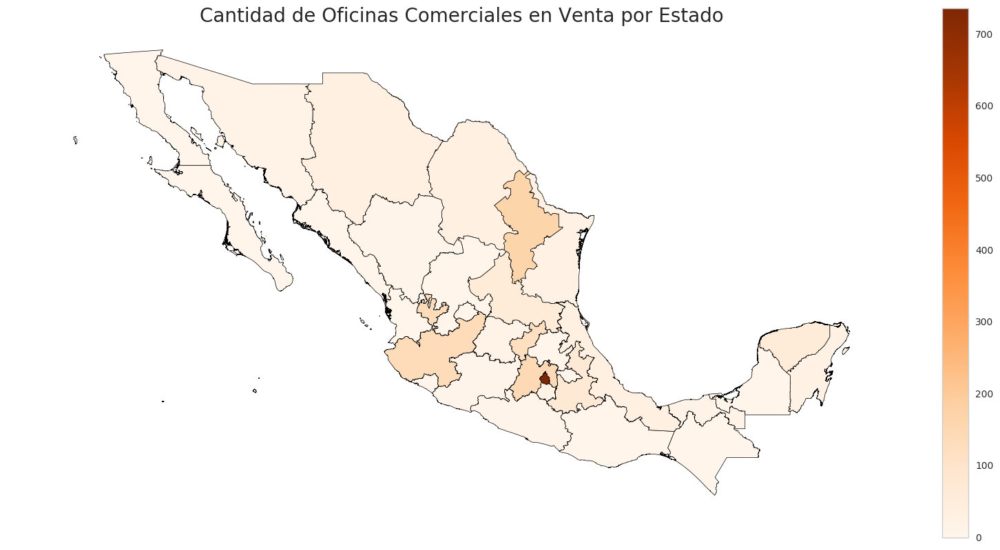

In [82]:
fig, grafico_cantidad_oficina_comercial_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_oficina_comercial_provincia_mex.plot(column='cantidad',cmap='Oranges', edgecolor='black',ax=grafico_cantidad_oficina_comercial_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_oficina_comercial_provincia.axis('off')
grafico_cantidad_oficina_comercial_provincia.set_title("Cantidad de Oficinas Comerciales en Venta por Estado",fontsize=20)

Como lo habíamos previsto, la mayor cantidad de oficinas en venta se encuentra en el Distrito Federal.

#### 3.3.6) Duplex

In [84]:
duplex=propiedades[(propiedades['tipodepropiedad']=='Duplex')]
cantidad_duplex=duplex['provincia'].value_counts().reset_index()
cantidad_duplex.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_duplex

,provincia,cantidad
0,Edo. de México,148
1,Jalisco,46
2,Distrito Federal,43
3,Querétaro,27
4,Baja California Norte,23
5,Puebla,21
6,Michoacán,9
7,Morelos,7
8,Nuevo León,5
9,Hidalgo,4


In [85]:
cantidad_duplex_provincia_mex=pd.merge(mex,cantidad_duplex,on='provincia',how='left')
cantidad_duplex_provincia_mex.fillna(0,inplace=True)
cantidad_duplex_provincia_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,0,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,0,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",0.0
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,0,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",23.0
2,2568834,MEX,Campeche,Campeche,Campeche,0,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,0,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",0.0
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,0,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,1.0
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,0,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,0,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",0.0


Text(0.5,1,'Cantidad de Duplex en Venta por Estado')

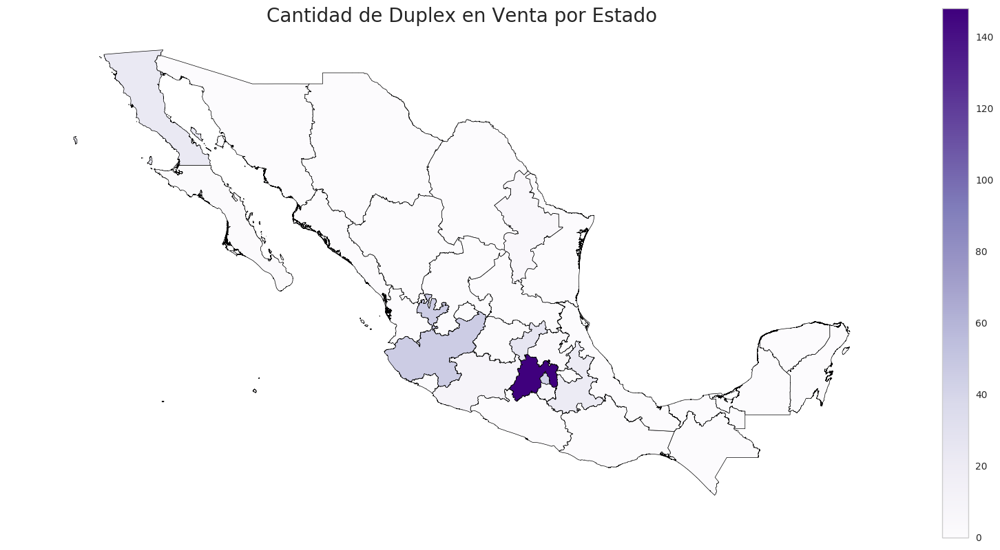

In [86]:
fig, grafico_cantidad_duplex_provincia = plt.subplots(1, figsize=(20, 10))
cantidad_duplex_provincia_mex.plot(column='cantidad',cmap='Purples', edgecolor='black',ax=grafico_cantidad_duplex_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_cantidad_duplex_provincia.axis('off')
grafico_cantidad_duplex_provincia.set_title("Cantidad de Duplex en Venta por Estado",fontsize=20)

Se puede ver que la provincia que tiene la mayor cantidad de Duplex en venta es el Estado de México, lo cual nuevamente, no parece que sea al azar.

### 3.4) Antigüedad por Provincia

In [126]:
antiguedad=propiedades[['provincia','antiguedad']].copy()
antiguedad.dropna(inplace=True)
antiguedad_provincia=antiguedad.groupby(['provincia']).agg({'antiguedad':'mean'})
antiguedad_provincia.reset_index(inplace=True)
antiguedad_provincia

,provincia,antiguedad
0,Aguascalientes,7.524580
1,Baja California Norte,5.788405
2,Baja California Sur,2.459770
3,Campeche,3.914573
4,Chiapas,5.412871
5,Chihuahua,6.518198
6,Coahuila,6.306214
7,Colima,5.674877
8,Distrito Federal,12.189608
9,Durango,4.993980


In [127]:
antiguedad_provincias_mex=pd.merge(mex,antiguedad_provincia,on='provincia',how='inner')
antiguedad_provincias_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,antiguedad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",7.524580
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",5.788405
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",3.914573
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,5.412871
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",6.518198


Text(0.5,1,'Promedio de Antigüedad de las Propiedades por Estado')

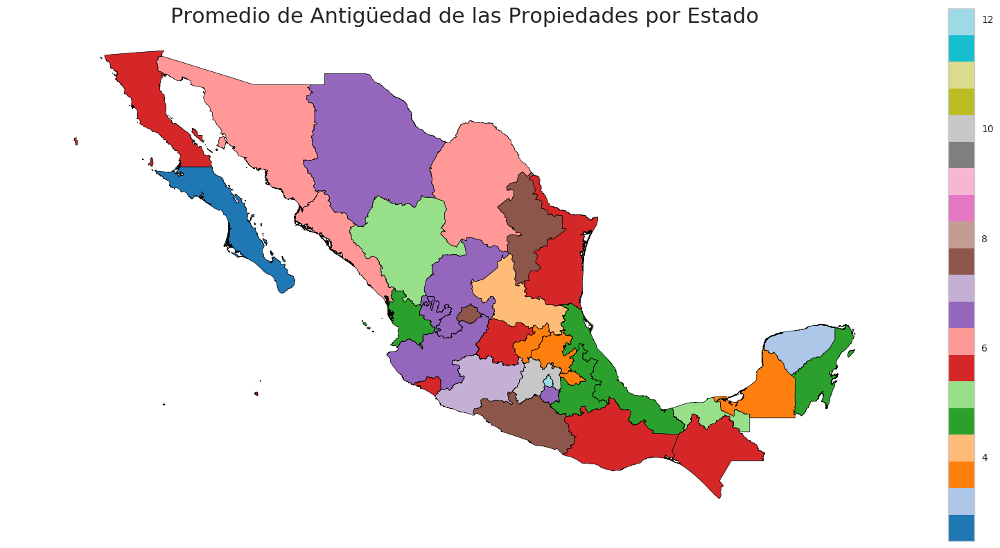

In [128]:
fig, grafico_antiguedad_provincias = plt.subplots(1, figsize=(20, 10))
antiguedad_provincias_mex.plot(column='antiguedad',cmap='tab20', edgecolor='black',ax=grafico_antiguedad_provincias,legend=True,figsize=(30,30),linewidth=0.5)
grafico_antiguedad_provincias.axis('off')
grafico_antiguedad_provincias.set_title("Promedio de Antigüedad de las Propiedades por Estado",fontsize=22)

## 4) Anexos

Ahora haremos un análisis acerca de las cosas que puden o no tener las propiedades o que cosas tienen próximas o no.

### 4.1) Análisis General

In [87]:
#Contamos la cantidad de cada uno
cant_sum=propiedades['usosmultiples'].value_counts().sort_index().reset_index()
cant_gim=propiedades['gimnasio'].value_counts().sort_index().reset_index()
cant_piscina=propiedades['piscina'].value_counts().sort_index().reset_index()
cant_escuelas=propiedades['escuelascercanas'].value_counts().sort_index().reset_index()
cant_centros=propiedades['centroscomercialescercanos'].value_counts().sort_index().reset_index()

In [89]:
#Los juntmos todos en un solo dataframe
cantidad_total=pd.merge(cant_sum,cant_gim,on='index',how='inner')
cantidad_total=pd.merge(cantidad_total,cant_piscina,on='index',how='inner')
cantidad_total=pd.merge(cantidad_total,cant_escuelas,on='index',how='inner')
cantidad_total=pd.merge(cantidad_total,cant_centros,on='index',how='inner')

In [90]:
#Renombramos los index y reemplazamos los valores para que tengan sentido
cantidad_total['index'].replace({0.0:'NO',1.0:'SI'},inplace=True)
cantidad_total.rename(columns={'index':'Hay','usosmultiples':'SUM','gimnasio':'Gimnasio','piscina':'Piscina','escuelascercanas':'Escuelas','centroscomercialescercanos':'Centros'},inplace=True)
cantidad_total.set_index('Hay',inplace=True)
cantidad_total

,SUM,Gimnasio,Piscina,Escuelas,Centros
Hay,,,,,
NO,226778,225006,219028,133406,144832
SI,13222,14994,20972,106594,95168


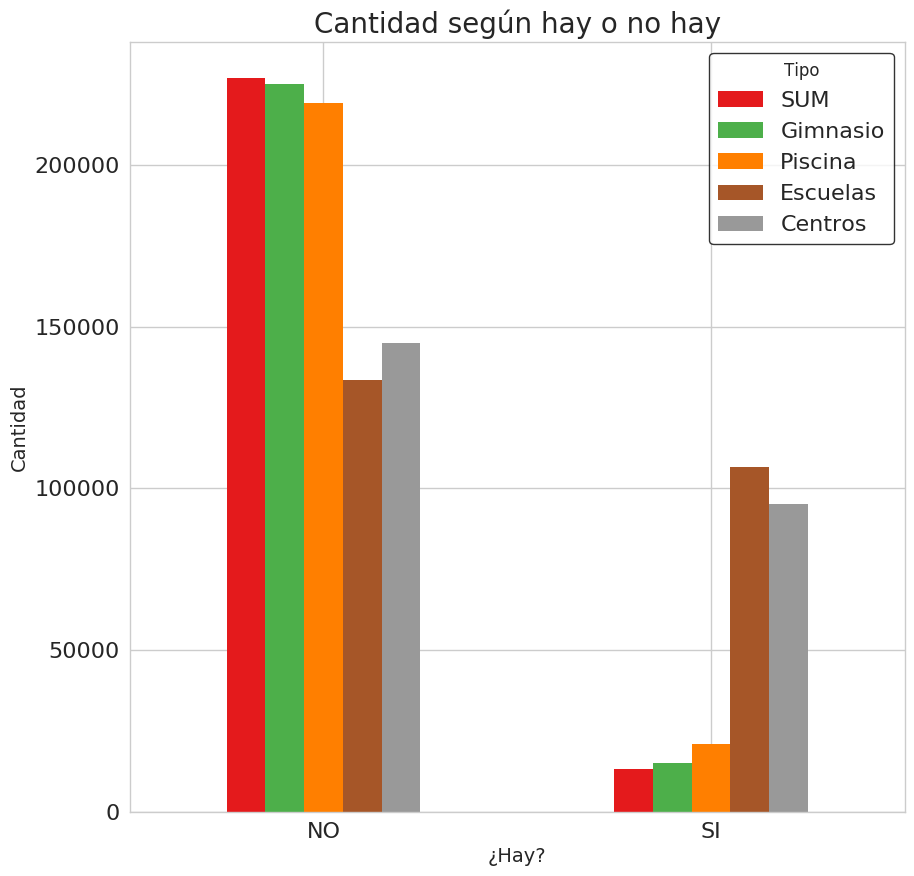

In [91]:
grafico_cantidad_total=cantidad_total.plot(kind='bar',cmap='Set1',figsize=(10,10),fontsize=16,rot=0)
grafico_cantidad_total.set_title("Cantidad según hay o no hay",fontsize=20)
grafico_cantidad_total.set_xlabel("¿Hay?",fontsize=14)
grafico_cantidad_total.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(fontsize=16,title='Tipo',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

Se puede ver que en la mayoria predomina el no, en los anexos más extraños, tales como el SUM o el Gimnasio, la brecha entre el No y el Si es muy grande mientras que en algo más común, como las Escuelas Cercanas o los Centros Comerciales cercanos suele haber una diferencia más pequeña. Ahora analizaremos cada uno individualmente.

### 4.2) Análisis Individual

#### 4.2.1) Piscina

In [107]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
piscina=propiedades[['lat','lng','piscina']].copy()
piscina.dropna(inplace=True)
piscina_cerca=piscina[(piscina['piscina']==1.0)]
filtrado_piscina_cerca=piscina_cerca[(piscina_cerca['lat']<=lat_maxima) & (piscina_cerca['lat']>=lat_minima) & (piscina_cerca['lng']<=lng_maxima) & (piscina_cerca['lng']>=lng_minima)]
filtrado_piscina_cerca.head()

,lat,lng,piscina
64,19.334247,-99.242254,1
68,18.799324,-99.202627,1
82,20.646004,-100.352765,1
101,18.932857,-99.230038,1
135,19.415436,-99.170290,1


In [109]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_piscina_cerca['lng'], filtrado_piscina_cerca['lat'])]
coordenadas_piscina_cerca = gpd.GeoDataFrame(filtrado_piscina_cerca, geometry=geometry)   
coordenadas_piscina_cerca.head()

,lat,lng,piscina,geometry
64,19.334247,-99.242254,1,POINT (-99.24225350577393 19.33424659180134)
68,18.799324,-99.202627,1,POINT (-99.20262683809813 18.79932411040545)
82,20.646004,-100.352765,1,POINT (-100.3527645060547 20.6460038109047)
101,18.932857,-99.230038,1,POINT (-99.2300376 18.932856566667)
135,19.415436,-99.170290,1,POINT (-99.1702903126892 19.41543640641217)


Text(0.5,1,'Distribución de Propiedades con Piscina por Estado')

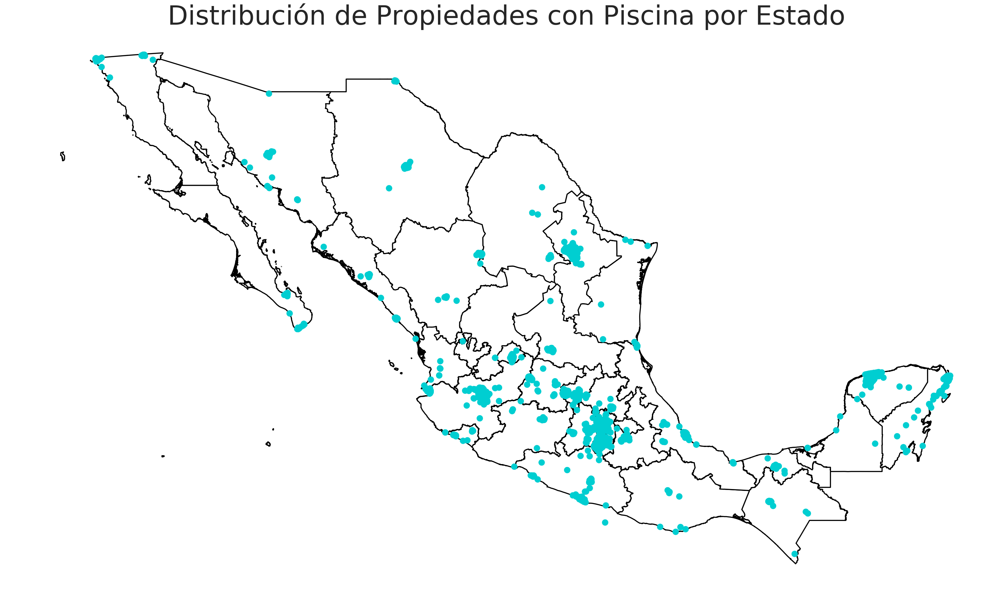

In [110]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_piscinas=coordenadas_piscina_cerca.plot(column='piscina',cmap=ListedColormap('darkturquoise'),ax=ax,markersize=200)
grafico_piscinas.set_title("Distribución de Propiedades con Piscina por Estado",fontsize=60)

Podemos ver que la mayor cantidad de propiedades con Piscina se encuentran en el Distrito Federal y Estado de México. Así mismo, también se hay varias en Jalisco, Nuevo León, Yucatán y Quintana Roo.

#### 4.2.2) Escuelas Cercanas

In [111]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
escuelas=propiedades[['lat','lng','escuelascercanas']].copy()
escuelas.dropna(inplace=True)
escuelas_cerca=escuelas[(escuelas['escuelascercanas']==1.0)]
filtrado_escuelas_cerca=escuelas_cerca[(escuelas_cerca['lat']<=lat_maxima) & (escuelas_cerca['lat']>=lat_minima) & (escuelas_cerca['lng']<=lng_maxima) & (escuelas_cerca['lng']>=lng_minima)]
filtrado_escuelas_cerca.head()

,lat,lng,escuelascercanas
1,19.310205,-99.227655,1
3,19.301890,-99.688015,1
10,22.195878,-101.018956,1
12,20.682878,-100.317503,1
16,20.708760,-100.459303,1


In [112]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_escuelas_cerca['lng'], filtrado_escuelas_cerca['lat'])]
coordenadas_escuelas_cerca = gpd.GeoDataFrame(filtrado_escuelas_cerca, geometry=geometry)   
coordenadas_escuelas_cerca.head()

,lat,lng,escuelascercanas,geometry
1,19.310205,-99.227655,1,POINT (-99.2276548 19.3102045)
3,19.301890,-99.688015,1,POINT (-99.6880151 19.3018899)
10,22.195878,-101.018956,1,POINT (-101.0189558599075 22.19587786422682)
12,20.682878,-100.317503,1,POINT (-100.3175029752441 20.68287811087097)
16,20.708760,-100.459303,1,POINT (-100.45930315734 20.708759543088)


Text(0.5,1,'Distribución de Propiedades con Escuelas Cercanas por Estado')

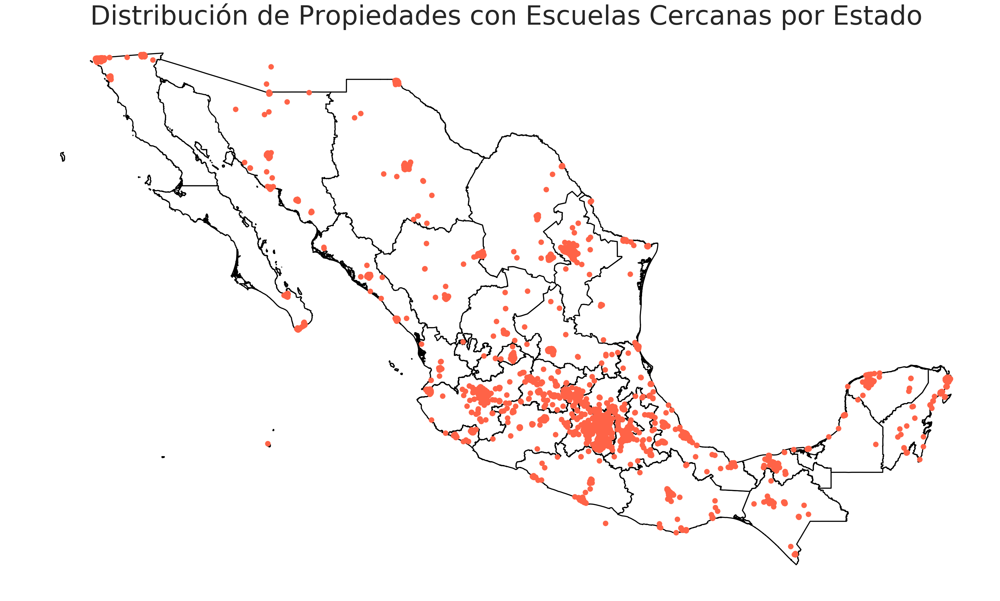

In [113]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_escuelas=coordenadas_escuelas_cerca.plot(column='escuelascercanas',cmap=ListedColormap('tomato'),ax=ax,markersize=150)
grafico_escuelas.set_title("Distribución de Propiedades con Escuelas Cercanas por Estado",fontsize=60)

Se puede ver que cuanto más cerca se encuentran del centro del País, mayor probabilidad de tener una Escuela Cerca hay, a medida que nos vamos alejando podemos ver que ya la cantidad de Escuelas disminuye. Así mismo, se puede ver que donde menor cantidad de Escuelas Cercanas hay es en la frontera entre Baja California Norte y Sur, ya que se encuentran solamente en la parte Sur de Baja California Sur y en el Norte de Baja California Norte.

#### 4.2.3) Centros Comerciales Cercanos

In [114]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
centros_comerciales=propiedades[['lat','lng','centroscomercialescercanos']].copy()
centros_comerciales.dropna(inplace=True)
centros_comerciales_cerca=centros_comerciales[(centros_comerciales['centroscomercialescercanos']==1.0)]
filtrado_centros_comerciales_cerca=centros_comerciales_cerca[(centros_comerciales_cerca['lat']<=lat_maxima) & (centros_comerciales_cerca['lat']>=lat_minima) & (centros_comerciales_cerca['lng']<=lng_maxima) & (centros_comerciales_cerca['lng']>=lng_minima)]
filtrado_centros_comerciales_cerca.head()

,lat,lng,centroscomercialescercanos
1,19.310205,-99.227655,1
3,19.301890,-99.688015,1
5,19.300612,-99.148475,1
10,22.195878,-101.018956,1
12,20.682878,-100.317503,1


In [115]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_centros_comerciales_cerca['lng'], filtrado_centros_comerciales_cerca['lat'])]
coordenadas_centros_comerciales_cerca = gpd.GeoDataFrame(filtrado_centros_comerciales_cerca, geometry=geometry)   
coordenadas_centros_comerciales_cerca.head()

,lat,lng,centroscomercialescercanos,geometry
1,19.310205,-99.227655,1,POINT (-99.2276548 19.3102045)
3,19.301890,-99.688015,1,POINT (-99.6880151 19.3018899)
5,19.300612,-99.148475,1,POINT (-99.14847480000005 19.300612)
10,22.195878,-101.018956,1,POINT (-101.0189558599075 22.19587786422682)
12,20.682878,-100.317503,1,POINT (-100.3175029752441 20.68287811087097)


Text(0.5,1,'Distribución de Propiedades con Centros Comerciales Cercanos por Estado')

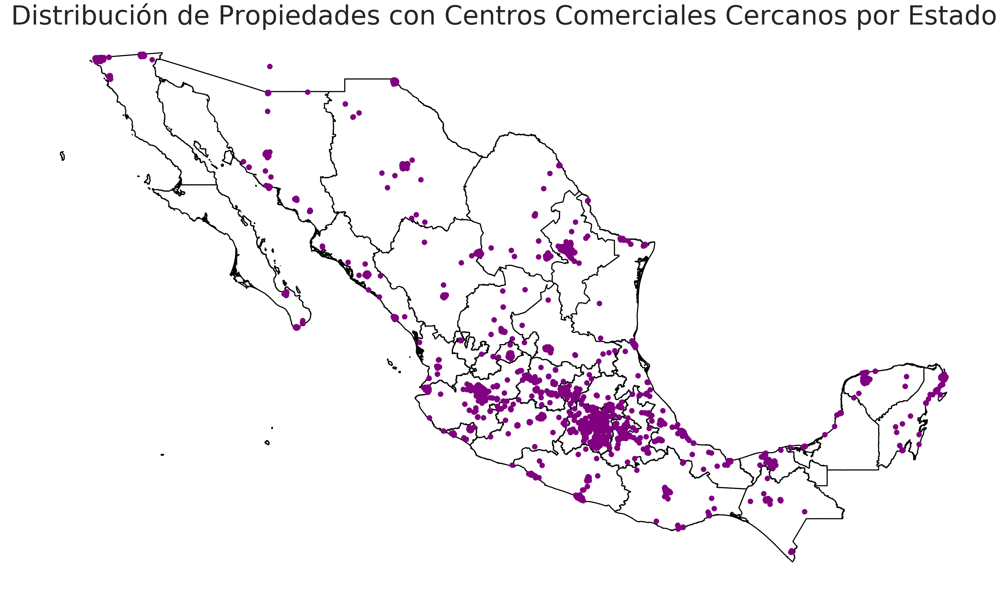

In [116]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_centros_comerciales=coordenadas_centros_comerciales_cerca.plot(column='centroscomercialescercanos',cmap=ListedColormap('purple'),ax=ax,markersize=150)
grafico_centros_comerciales.set_title("Distribución de Propiedades con Centros Comerciales Cercanos por Estado",fontsize=60)

Se puede ver que sigue la misma tendencia que se vió con las Escuelas, cuanto más cerca la propiedad se encuentra del centro del País, mayor es la probabilidad de que tenga un Centro Comercial cerca.

#### 4.2.4) Gimnasio

In [119]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
gimnasio=propiedades[['lat','lng','gimnasio']].copy()
gimnasio.dropna(inplace=True)
gimnasio_cerca=gimnasio[(gimnasio['gimnasio']==1)]
filtrado_gimnasio_cerca=gimnasio_cerca[(gimnasio_cerca['lat']<=lat_maxima) & (gimnasio_cerca['lat']>=lat_minima) & (gimnasio_cerca['lng']<=lng_maxima) & (gimnasio_cerca['lng']>=lng_minima)]
filtrado_gimnasio_cerca.head()

,lat,lng,gimnasio
64,19.334247,-99.242254,1
100,19.339452,-99.238162,1
135,19.415436,-99.170290,1
138,19.459710,-99.180036,1
166,20.572958,-103.465309,1


In [120]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_gimnasio_cerca['lng'], filtrado_gimnasio_cerca['lat'])]
coordenadas_gimnasio_cerca = gpd.GeoDataFrame(filtrado_gimnasio_cerca, geometry=geometry)   
coordenadas_gimnasio_cerca.head()

,lat,lng,gimnasio,geometry
64,19.334247,-99.242254,1,POINT (-99.24225350577393 19.33424659180134)
100,19.339452,-99.238162,1,POINT (-99.23816190000002 19.3394521)
135,19.415436,-99.170290,1,POINT (-99.1702903126892 19.41543640641217)
138,19.459710,-99.180036,1,POINT (-99.18003640000001 19.4597103)
166,20.572958,-103.465309,1,POINT (-103.4653090294434 20.5729581695714)


Text(0.5,1,'Distribución de Propiedades con Gimnasio por Estado')

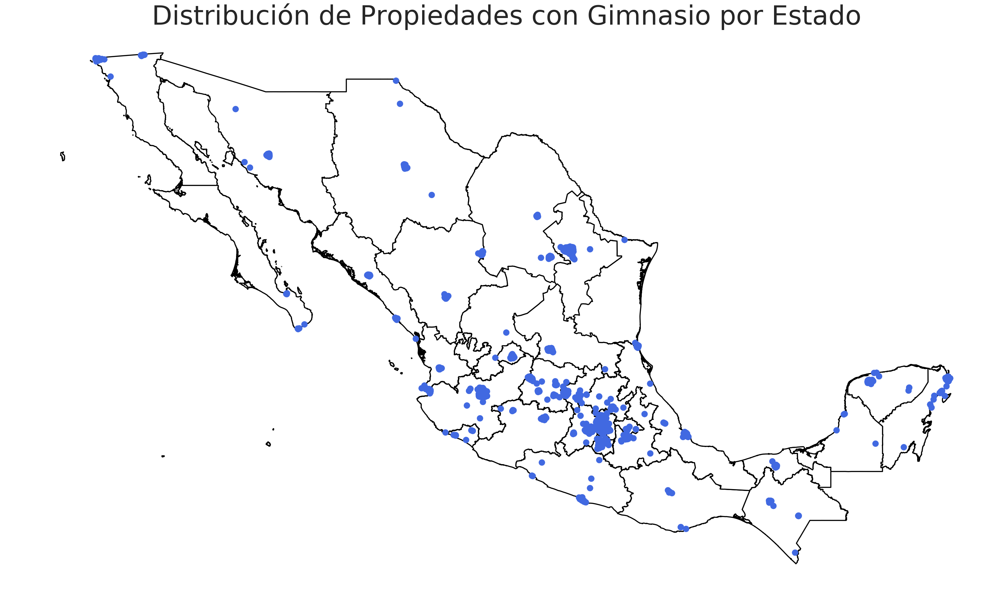

In [121]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_gimnasio=coordenadas_gimnasio_cerca.plot(column='gimnasio',cmap=ListedColormap('royalblue'),ax=ax,markersize=200)
grafico_gimnasio.set_title("Distribución de Propiedades con Gimnasio por Estado",fontsize=60)

#### 4.2.5) SUM

In [122]:
#Filtamos las coordenadas para que solamente esten las que se encuentren en México y solamente las que tengan piscina
SUM=propiedades[['lat','lng','usosmultiples']].copy()
SUM.dropna(inplace=True)
SUM_cerca=SUM[(SUM['usosmultiples']==1)]
filtrado_SUM_cerca=SUM_cerca[(SUM_cerca['lat']<=lat_maxima) & (SUM_cerca['lat']>=lat_minima) & (SUM_cerca['lng']<=lng_maxima) & (SUM_cerca['lng']>=lng_minima)]
filtrado_SUM_cerca.head()

,lat,lng,usosmultiples
12,20.682878,-100.317503,1
31,18.969631,-98.238497,1
34,19.408373,-99.267617,1
64,19.334247,-99.242254,1
82,20.646004,-100.352765,1


In [123]:
#Transformamos esas coordenadas a formato POINT con funcion Point
geometry = [Point(xy) for xy in zip(filtrado_SUM_cerca['lng'], filtrado_SUM_cerca['lat'])]
coordenadas_SUM_cerca = gpd.GeoDataFrame(filtrado_SUM_cerca, geometry=geometry)   
coordenadas_SUM_cerca.head()

,lat,lng,usosmultiples,geometry
12,20.682878,-100.317503,1,POINT (-100.3175029752441 20.68287811087097)
31,18.969631,-98.238497,1,POINT (-98.23849673333299 18.969630533333)
34,19.408373,-99.267617,1,POINT (-99.2676171 19.4083735)
64,19.334247,-99.242254,1,POINT (-99.24225350577393 19.33424659180134)
82,20.646004,-100.352765,1,POINT (-100.3527645060547 20.6460038109047)


Text(0.5,1,'Distribución de Propiedades con SUM por Estado')

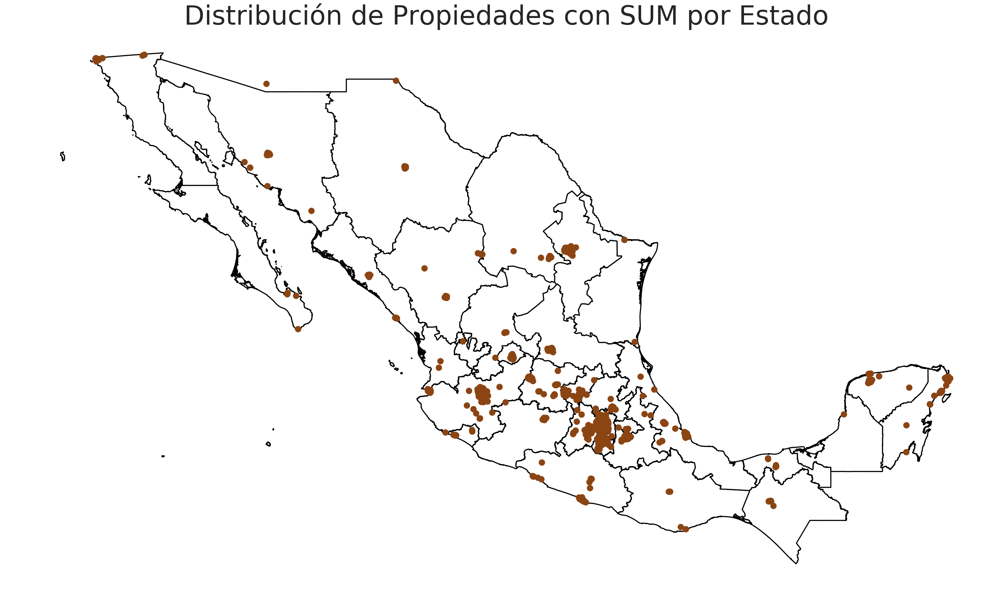

In [124]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_SUM=coordenadas_SUM_cerca.plot(column='usosmultiples',cmap=ListedColormap('saddlebrown'),ax=ax,markersize=200)
grafico_SUM.set_title("Distribución de Propiedades con SUM por Estado",fontsize=60)

#### 4.2.6) SUM y Gimnasio

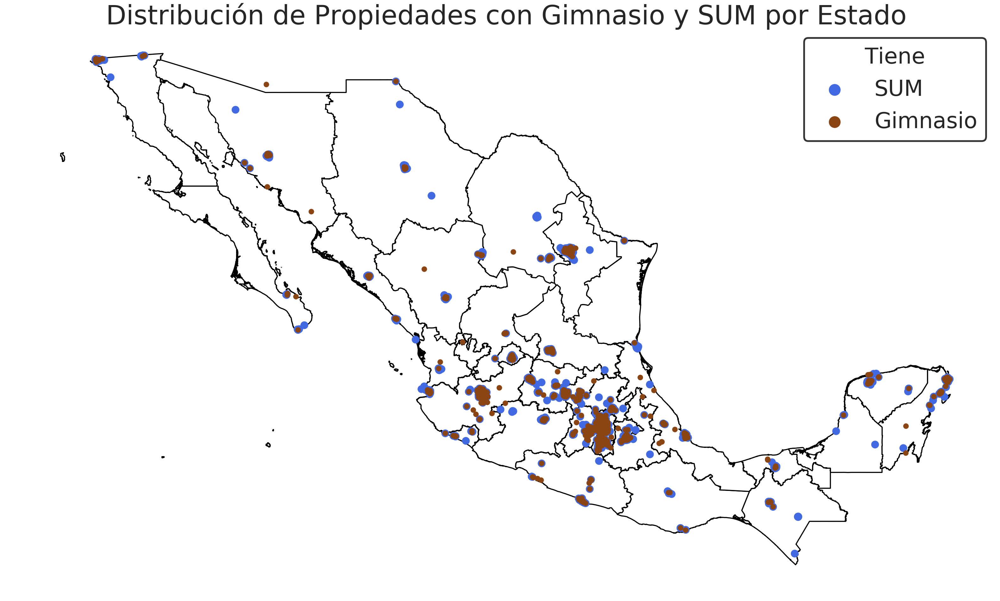

In [125]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_gimnasio=coordenadas_gimnasio_cerca.plot(column='gimnasio',cmap=ListedColormap('royalblue'),ax=ax,markersize=300)
grafico_SUM=coordenadas_SUM_cerca.plot(column='usosmultiples',cmap=ListedColormap('saddlebrown'),ax=ax,markersize=150)
grafico_gimnasio.set_title("Distribución de Propiedades con Gimnasio y SUM por Estado",fontsize=60)
leyenda=plt.legend(['SUM','Gimnasio'],fontsize=50,frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.set_title("Tiene",prop=dict(size=50))
leyenda.legendHandles[0]._sizes = [700]
leyenda.legendHandles[1]._sizes = [700]
leyenda.get_frame().set_linewidth(4.0)

## TIPO CON PRECIO

In [92]:
tipo_precio=propiedades[['tipodepropiedad','precio']]

In [93]:
tipo_precio.dropna(subset=['tipodepropiedad'],inplace=True)

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [94]:
tipo_propiedad_top=tipo_precio['tipodepropiedad'].value_counts().head(10).reset_index()
tipo_propiedad_top.drop(columns={'tipodepropiedad'},inplace=True)
tipo_propiedad_top.rename(columns={'index':'tipodepropiedad'},inplace=True)
tipo_propiedad_top

,tipodepropiedad
0,Casa
1,Apartamento
2,Casa en condominio
3,Terreno
4,Local Comercial
5,Oficina comercial
6,Bodega comercial
7,Edificio
8,Terreno comercial
9,Casa uso de suelo


In [15]:
tipo_precio_top=pd.merge(tipo_precio,tipo_propiedad_top,on='tipodepropiedad',how='inner')
tipo_precio_top

,tipodepropiedad,precio
0,Apartamento,2273000.0
1,Apartamento,1150000.0
2,Apartamento,1100000.0
3,Apartamento,310000.0
4,Apartamento,7200000.0
5,Apartamento,4750000.0
6,Apartamento,750000.0
7,Apartamento,980000.0
8,Apartamento,525000.0
9,Apartamento,1450000.0


Text(0.5,0,'Tipo de Propiedad')

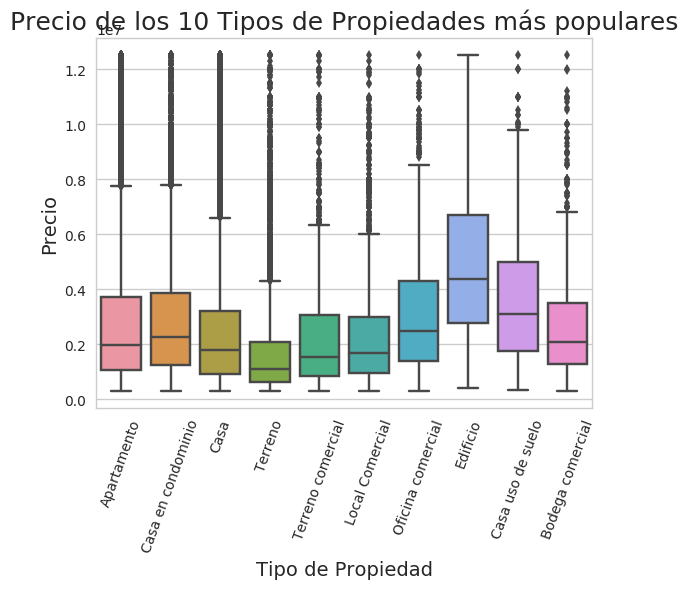

In [18]:
grafico_tipo_precio_top=sns.boxplot(y=tipo_precio_top['precio'],x=tipo_precio_top['tipodepropiedad'])
grafico_tipo_precio_top.set_xticklabels(grafico_tipo_precio_top.get_xticklabels(),rotation=70)
grafico_tipo_precio_top.set_title("Precio de los 10 Tipos de Propiedades más populares",fontsize=18)
grafico_tipo_precio_top.set_ylabel("Precio",fontsize=14)
grafico_tipo_precio_top.set_xlabel("Tipo de Propiedad",fontsize=14)

In [19]:
tipo_propiedad_primeros=propiedades['tipodepropiedad'].value_counts().head(4).reset_index()
tipo_propiedad_primeros.drop(columns={'tipodepropiedad'},inplace=True)
tipo_propiedad_primeros.rename(columns={'index':'tipodepropiedad'},inplace=True)
tipo_propiedad_primeros

,tipodepropiedad
0,Casa
1,Apartamento
2,Casa en condominio
3,Terreno


In [20]:
estacion_tipo=propiedades[['tipodepropiedad','Estacion']]
estacion_tipo.head()

,tipodepropiedad,Estacion
0,Apartamento,Verano
1,Casa en condominio,Verano
2,Casa,Otonio
3,Casa,Invierno
4,Apartamento,Primavera


In [21]:
estacion_tipo_primero=pd.merge(estacion_tipo,tipo_propiedad_primeros,on='tipodepropiedad',how='inner')
estacion_tipo_primero.head()

,tipodepropiedad,Estacion
0,Apartamento,Verano
1,Apartamento,Primavera
2,Apartamento,Invierno
3,Apartamento,Invierno
4,Apartamento,Otonio


In [22]:
estacion_tipo_primero['Valor']=1

In [23]:
pivot_estacion_tipo_primero=estacion_tipo_primero.pivot_table(index='tipodepropiedad',columns='Estacion',values='Valor',aggfunc='count')
pivot_estacion_tipo_primero

Estacion,Invierno,Otonio,Primavera,Verano
tipodepropiedad,,,,
Apartamento,12641,19257,11953,13490
Casa,31714,47771,28691,33541
Casa en condominio,4182,5901,4446,4768
Terreno,2123,3504,1965,2353


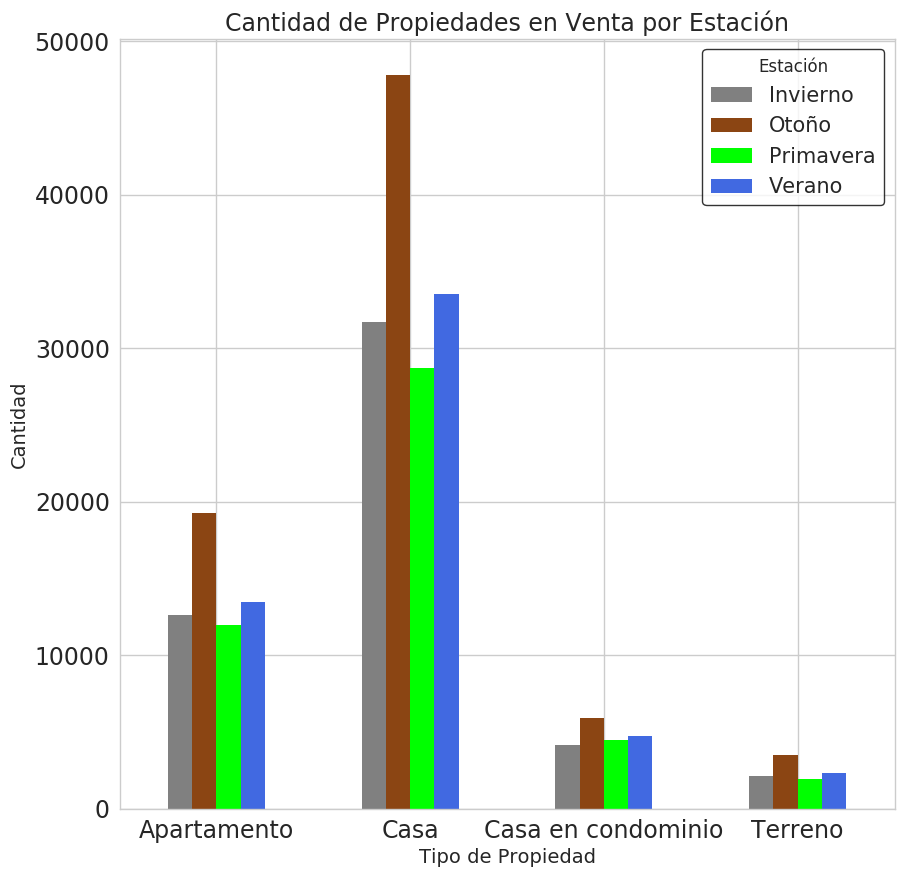

In [32]:
grafico_estaciones_tipo_primero=pivot_estacion_tipo_primero.plot(kind='bar',color=['grey','saddlebrown','lime','royalblue'],fontsize=17,figsize=(10,10),rot=0)
grafico_estaciones_tipo_primero.set_title("Cantidad de Propiedades en Venta por Estación",fontsize=17)
grafico_estaciones_tipo_primero.set_xlabel("Tipo de Propiedad",fontsize=14)
grafico_estaciones_tipo_primero.set_ylabel("Cantidad",fontsize=14)
leyenda=plt.legend(['Invierno','Otoño','Primavera','Verano'],fontsize=15,title='Estación',frameon=True,facecolor='white',edgecolor='black',loc='best')
leyenda.get_frame().set_linewidth(1.0)

In [15]:
muni_df=mex_municipio[(mex_municipio['provincia']=='09')]
muni_df.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry
336,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...
337,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...
338,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ..."
339,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...
340,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...


In [13]:
df=propiedades[(propiedades['provincia']=='Distrito Federal')]
distrito=df['ciudad'].value_counts().head(16).reset_index()
distrito.rename(columns={'index':'ciudad','ciudad':'cantidad'},inplace=True)
distrito['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
distrito

,ciudad,cantidad
0,Benito Juárez,11013
1,Alvaro Obregón,6632
2,Cuauhtémoc,6539
3,Miguel Hidalgo,5795
4,Tlalpan,5721
5,Coyoacán,5293
6,Gustavo A. Madero,3141
7,Iztapalapa,3093
8,Cuajimalpa de Morelos,3020
9,Azcapotzalco,1972


In [23]:
muni_df_cantidad=pd.merge(muni_df,distrito,on='ciudad',how='inner')
muni_df_cantidad.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,cantidad
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,1972
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,3141
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",5795
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,1207
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,1456


In [107]:
AL = mpatches.Patch(color='white',label='00 - Azcapotzalco')
GM = mpatches.Patch(color='white',label='01 - Gustavo A. Madero')
MH = mpatches.Patch(color='white',label='02 - Miguel Hidalgo')
IZ = mpatches.Patch(color='white',label='03 - Iztacalco')
VC = mpatches.Patch(color='white',label='04 - Venustiano Carranza')
IP = mpatches.Patch(color='white',label='05 - Iztapalapa')
TL = mpatches.Patch(color='white',label='06 - Tlalpan')
XO = mpatches.Patch(color='white',label='07 - Xochimilco')
MC = mpatches.Patch(color='white',label='08 - La Magdalena Contreras')
BJ = mpatches.Patch(color='white',label='09 - Benito Juárez')
CT = mpatches.Patch(color='white',label='10 - Cuauhtémoc')
AO = mpatches.Patch(color='white',label='11 - Álvaro Obregón')
CM = mpatches.Patch(color='white',label='12 - Cuajimalpa de Morelos')
CY = mpatches.Patch(color='white',label='13 - Coyoacán')
TH = mpatches.Patch(color='white',label='14 - Tláhuac')
MA = mpatches.Patch(color='white',label='15 - Milpa Alta')

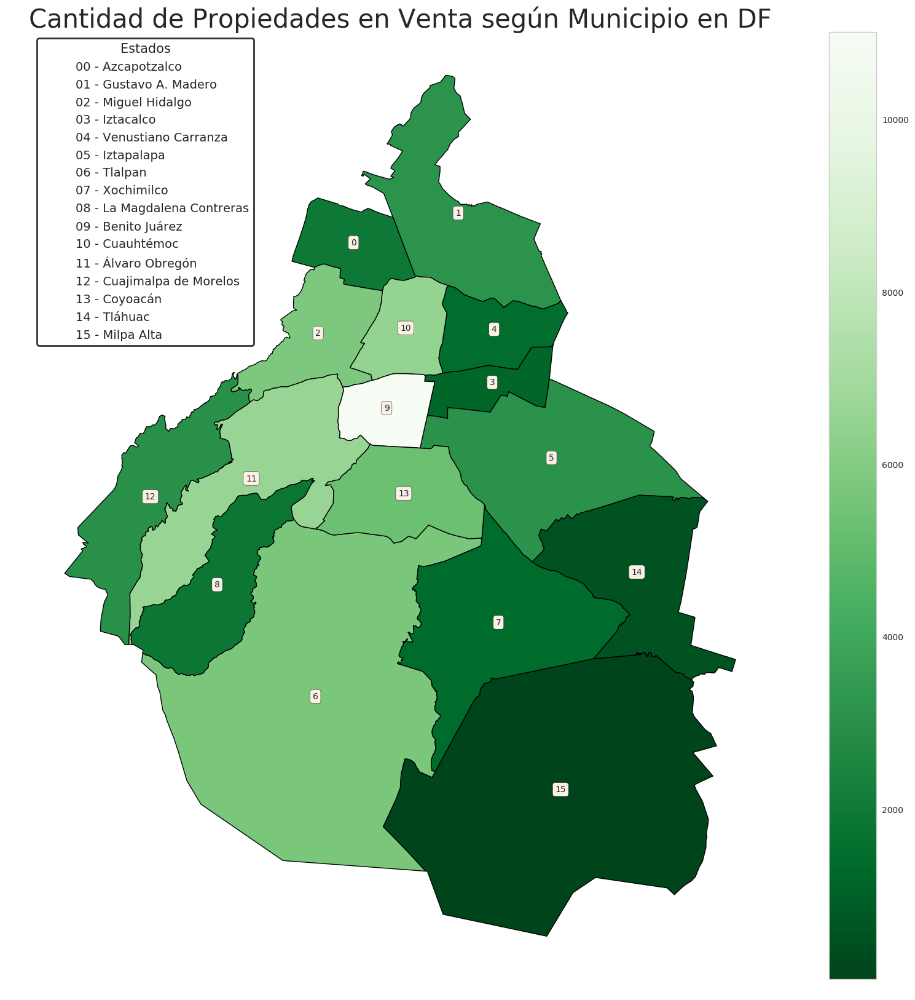

In [106]:
fig, grafico_distrito_ciudad = plt.subplots(1, figsize=(25, 20))
grafico_cantidad=muni_df_cantidad.plot(column='cantidad',cmap='Greens_r', edgecolor='black',ax=grafico_distrito_ciudad,legend=True,figsize=(30,30),linewidth=1.0)
grafico_distrito_ciudad.axis('off')
grafico_distrito_ciudad.set_title("Cantidad de Propiedades en Venta según Municipio en DF",fontsize=30)
props = dict(boxstyle='round', facecolor='linen', alpha=1)
for point in muni_df_cantidad.iterrows():
    grafico_cantidad.text(point[1]['geometry'].centroid.x,point[1]['geometry'].centroid.y,point[0],horizontalalignment='center',fontsize=16,bbox=props)
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)    

In [55]:
precio_ciudad=df.groupby(['ciudad']).agg({'precio':'mean'})
precio_ciudad=precio_ciudad.reset_index().head(16)
precio_ciudad['ciudad'].replace({'Alvaro Obregón':'Álvaro Obregón'},inplace=True)
precio_ciudad

,ciudad,precio
0,Álvaro Obregón,4.470196e+06
1,Azcapotzalco,1.966497e+06
2,Benito Juárez,3.384934e+06
3,Coyoacán,3.407009e+06
4,Cuajimalpa de Morelos,4.722205e+06
5,Cuauhtémoc,3.411680e+06
6,Gustavo A. Madero,2.593199e+06
7,Iztacalco,2.157887e+06
8,Iztapalapa,1.699366e+06
9,La Magdalena Contreras,4.605869e+06


In [56]:
muni_df_precio=pd.merge(muni_df,precio_ciudad,on='ciudad',how='inner')
muni_df_precio.head()

,provincia,CVE_MUN,ciudad,OID_1,cov_,cov_id,geometry,precio
0,09,002,Azcapotzalco,337,337,338,POLYGON ((-99.18244684291649 19.50756095368394...,1.966497e+06
1,09,005,Gustavo A. Madero,338,338,339,POLYGON ((-99.11788784658718 19.59059230135504...,2.593199e+06
2,09,016,Miguel Hidalgo,339,339,340,"POLYGON ((-99.190444197047 19.47045898377894, ...",4.496526e+06
3,09,006,Iztacalco,340,340,341,POLYGON ((-99.05578649585527 19.42214108628177...,2.157887e+06
4,09,017,Venustiano Carranza,341,341,342,POLYGON ((-99.10946105900705 19.45291794334054...,1.943751e+06


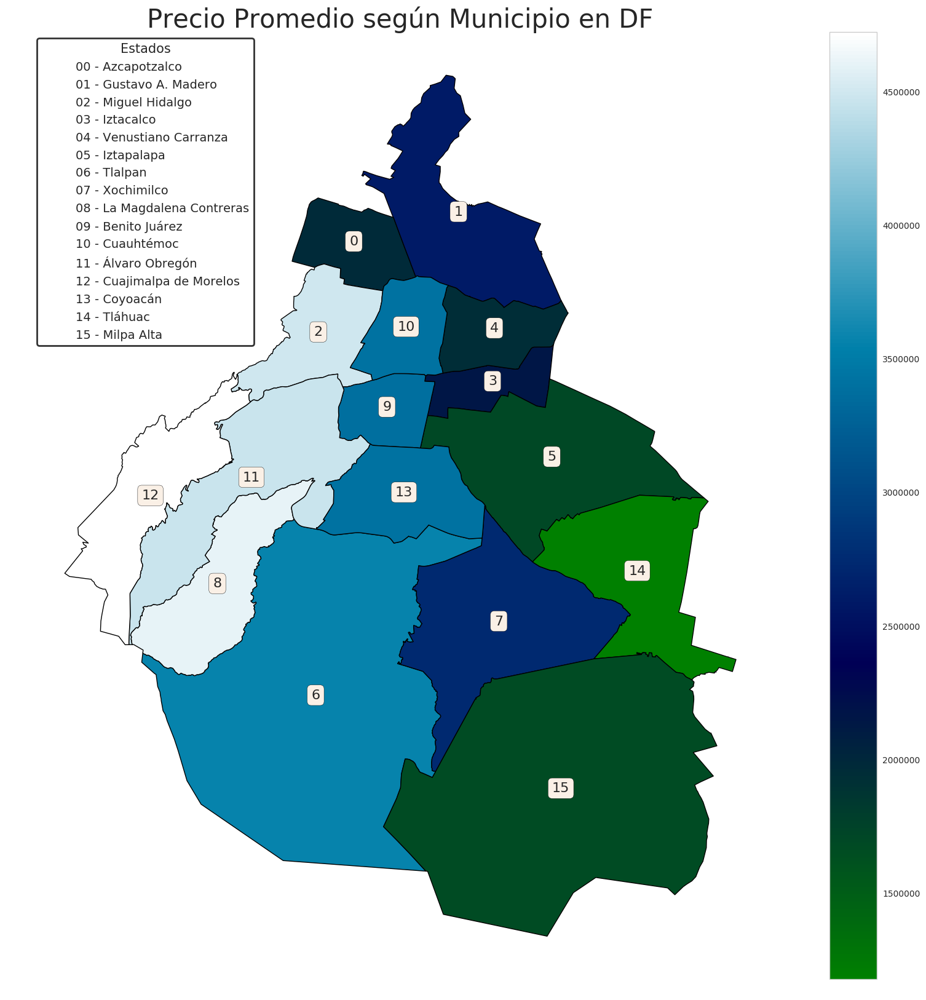

In [105]:
fig, grafico_distrito_ciudad_precio = plt.subplots(1, figsize=(25, 20))
grafico_precio=muni_df_precio.plot(column='precio',cmap='ocean', edgecolor='black',ax=grafico_distrito_ciudad_precio,legend=True,figsize=(30,30),linewidth=1.0)
grafico_distrito_ciudad_precio.axis('off')
grafico_distrito_ciudad_precio.set_title("Precio Promedio según Municipio en DF",fontsize=30)
props = dict(boxstyle='round', facecolor='linen', alpha=1)
for point in muni_df_precio.iterrows():
    grafico_precio.text(point[1]['geometry'].centroid.x,point[1]['geometry'].centroid.y,point[0],horizontalalignment='center',fontsize=16,bbox=props)
leyenda=plt.legend(handles=[AL,GM,MH,IZ,VC,IP,TL,XO,MC,BJ,CT,AO,CM,CY,TH,MA],loc=2,fontsize=14,frameon=True,facecolor='white',edgecolor='black') 
leyenda.set_title("Estados",prop=dict(size=15))
leyenda.get_frame().set_linewidth(2.0)

In [23]:
metros=propiedades[['provincia','metrostotales','metroscubiertos','difmetros']]
metros.head()

,provincia,metrostotales,metroscubiertos,difmetros
0,Distrito Federal,80.0,80.0,0.0
1,Distrito Federal,180.0,268.0,-88.0
2,Jalisco,166.0,144.0,22.0
3,Edo. de México,67.0,63.0,4.0
4,Jalisco,95.0,95.0,0.0


In [24]:
filtrado_metros=metros[(metros['difmetros']>=0.0)]
filtrado_metros.head()

,provincia,metrostotales,metroscubiertos,difmetros
0,Distrito Federal,80.0,80.0,0.0
2,Jalisco,166.0,144.0,22.0
3,Edo. de México,67.0,63.0,4.0
4,Jalisco,95.0,95.0,0.0
5,Distrito Federal,90.0,75.0,15.0


In [25]:
metros_totales=filtrado_metros.groupby(['provincia']).agg({'metrostotales':'mean'})
metros_totales.reset_index(inplace=True)
metros_totales

,provincia,metrostotales
0,Aguascalientes,173.553679
1,Baja California Norte,129.352162
2,Baja California Sur,181.482362
3,Campeche,206.518248
4,Chiapas,197.726862
5,Chihuahua,211.106124
6,Coahuila,210.720730
7,Colima,170.044405
8,Distrito Federal,147.190325
9,Durango,181.250435


In [26]:
metros_totales_mex=pd.merge(mex,metros_totales,on='provincia',how='inner')
metros_totales_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,metrostotales
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",173.553679
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",129.352162
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",206.518248
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,197.726862
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",211.106124


Text(0.5,1,'Promedio de Metros Totales por Estado')

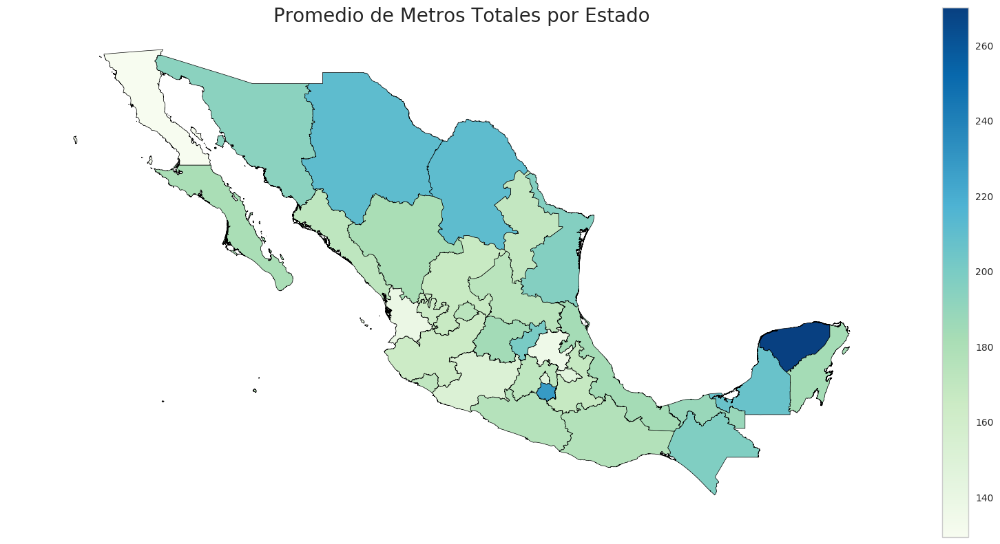

In [27]:
fig, grafico_metros_totales_provincia = plt.subplots(1, figsize=(20, 10))
metros_totales_mex.plot(column='metrostotales',cmap='GnBu', edgecolor='black',ax=grafico_metros_totales_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_metros_totales_provincia.axis('off')
grafico_metros_totales_provincia.set_title("Promedio de Metros Totales por Estado",fontsize=20)

In [28]:
metros_cubiertos=filtrado_metros.groupby(['provincia']).agg({'metroscubiertos':'mean'})
metros_cubiertos.reset_index(inplace=True)
metros_cubiertos

,provincia,metroscubiertos
0,Aguascalientes,138.516285
1,Baja California Norte,83.545773
2,Baja California Sur,101.848160
3,Campeche,139.021898
4,Chiapas,151.483070
5,Chihuahua,158.788171
6,Coahuila,163.585403
7,Colima,119.461812
8,Distrito Federal,131.185928
9,Durango,134.500870


In [29]:
metros_cubiertos_mex=pd.merge(mex,metros_cubiertos,on='provincia',how='inner')
metros_cubiertos_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,metroscubiertos
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",138.516285
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",83.545773
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",139.021898
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,151.483070
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",158.788171


Text(0.5,1,'Promedio de Metros Cubiertos por Estado')

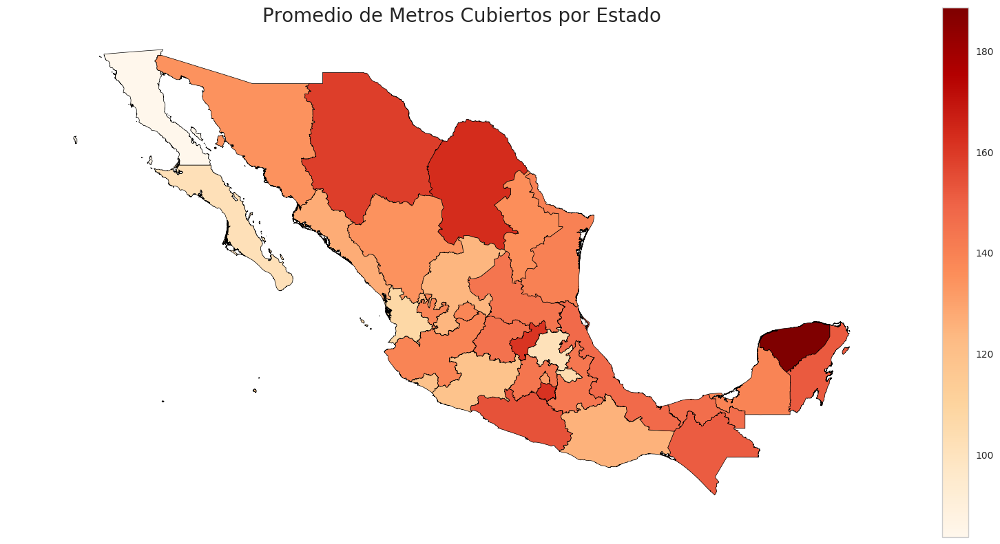

In [30]:
fig, grafico_metros_cubiertos_provincia = plt.subplots(1, figsize=(20, 10))
metros_cubiertos_mex.plot(column='metroscubiertos',cmap='OrRd', edgecolor='black',ax=grafico_metros_cubiertos_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_metros_cubiertos_provincia.axis('off')
grafico_metros_cubiertos_provincia.set_title("Promedio de Metros Cubiertos por Estado",fontsize=20)

In [32]:
dif_metros=filtrado_metros.groupby(['provincia']).agg({'difmetros':'mean'})
dif_metros.reset_index(inplace=True)
dif_metros

,provincia,difmetros
0,Aguascalientes,35.037394
1,Baja California Norte,45.806389
2,Baja California Sur,79.634202
3,Campeche,67.496350
4,Chiapas,46.243792
5,Chihuahua,52.317953
6,Coahuila,47.135327
7,Colima,50.582593
8,Distrito Federal,16.004398
9,Durango,46.749565


In [33]:
dif_metros_mex=pd.merge(mex,dif_metros,on='provincia',how='inner')
dif_metros_mex.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,difmetros
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",35.037394
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",45.806389
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",67.496350
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,46.243792
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",52.317953


Text(0.5,1,'Promedio de la Diferencia de Metros Totales y Cubiertos por Estado')

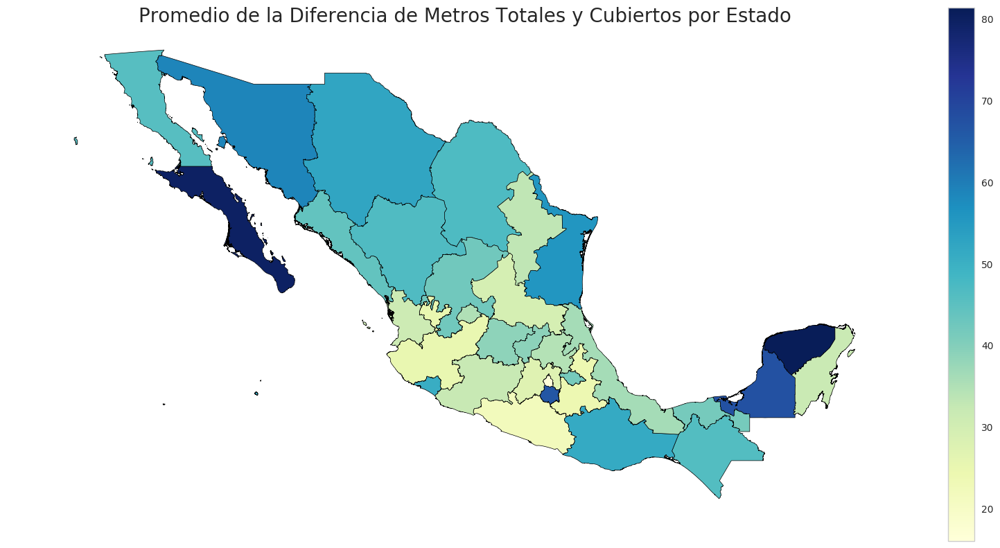

In [35]:
fig, grafico_dif_metros_provincia = plt.subplots(1, figsize=(20, 10))
dif_metros_mex.plot(column='difmetros',cmap='YlGnBu', edgecolor='black',ax=grafico_dif_metros_provincia,legend=True,figsize=(30,30),linewidth=0.5)
grafico_dif_metros_provincia.axis('off')
grafico_dif_metros_provincia.set_title("Promedio de la Diferencia de Metros Totales y Cubiertos por Estado",fontsize=20)

In [82]:
cantidad_banos=propiedades['banos'].value_counts().sort_index().reset_index()
cantidad_banos['index']=cantidad_banos['index'].astype('int32')
cantidad_banos['banos']=cantidad_banos['banos'].astype('int32')
cantidad_banos.set_index('index',inplace=True)
cantidad_banos

,banos
index,
1,58173
2,87683
3,49365
4,18558


In [83]:
cantidad_banos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4 entries, 1 to 4
Data columns (total 1 columns):
banos    4 non-null int32
dtypes: int32(1)
memory usage: 48.0 bytes


Text(0,0.5,'Baños')

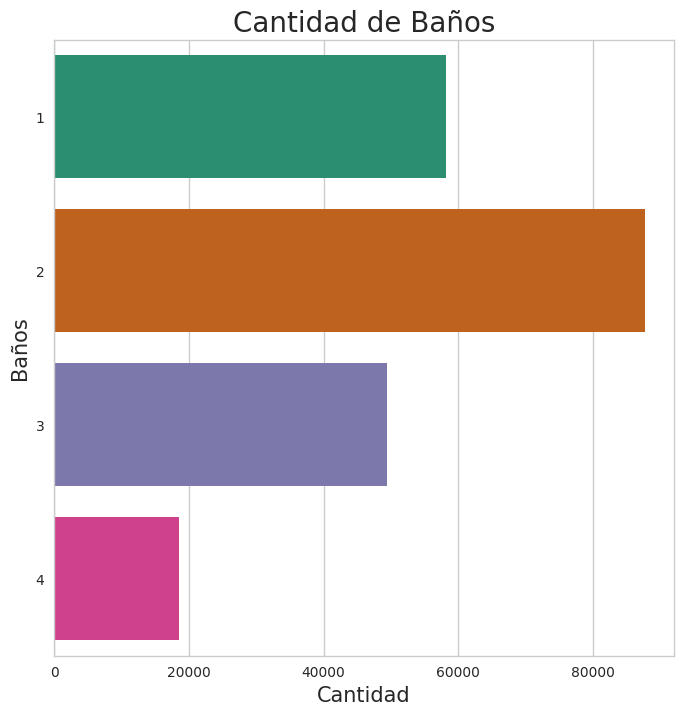

In [84]:
plt.subplots(figsize=(8,8))
grafico_cantidad_banos=sns.barplot(x=cantidad_banos['banos'],y=cantidad_banos.index,orient='h',palette='Dark2')
grafico_cantidad_banos.set_title("Cantidad de Baños",fontsize=20)
grafico_cantidad_banos.set_xlabel("Cantidad",fontsize=15)
grafico_cantidad_banos.set_ylabel("Baños",fontsize=15)

In [88]:
cantidad_habitaciones=propiedades['habitaciones'].value_counts().sort_index().reset_index()
cantidad_habitaciones['index']=cantidad_habitaciones['index'].astype('int32')
cantidad_habitaciones.set_index('index',inplace=True)
cantidad_habitaciones_top=cantidad_habitaciones.head(5)
cantidad_habitaciones_resto=cantidad_habitaciones.tail(5)
cantidad_habitaciones_top

,habitaciones
index,
1,5069
2,57808
3,121887
4,25068
5,4596


In [89]:
cantidad_habitaciones_resto

,habitaciones
index,
6,1669
7,539
8,398
9,179
10,316


Text(0,0.5,'Cantidad')

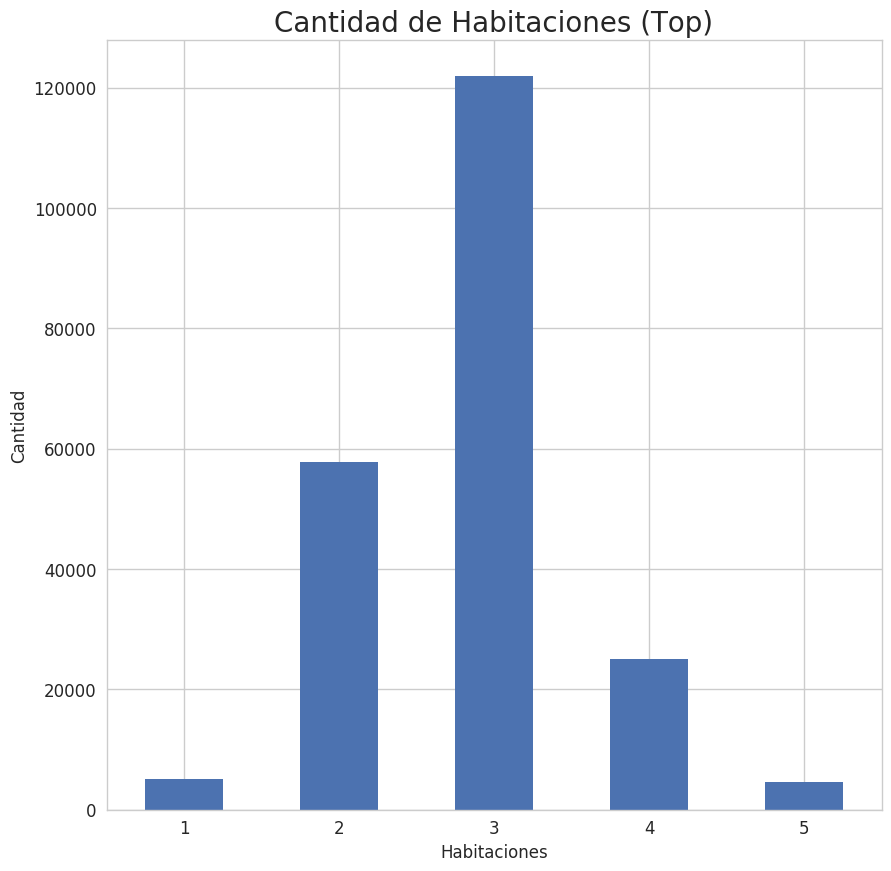

In [97]:
grafico_cantidad_habitaciones_top=cantidad_habitaciones_top.plot(kind='bar',rot=0,legend=False,fontsize=12,figsize=(10,10))
grafico_cantidad_habitaciones_top.set_title("Cantidad de Habitaciones (Top)",fontsize=20)
grafico_cantidad_habitaciones_top.set_xlabel("Habitaciones",fontsize=12)
grafico_cantidad_habitaciones_top.set_ylabel("Cantidad",fontsize=12)

Text(0,0.5,'Cantidad')

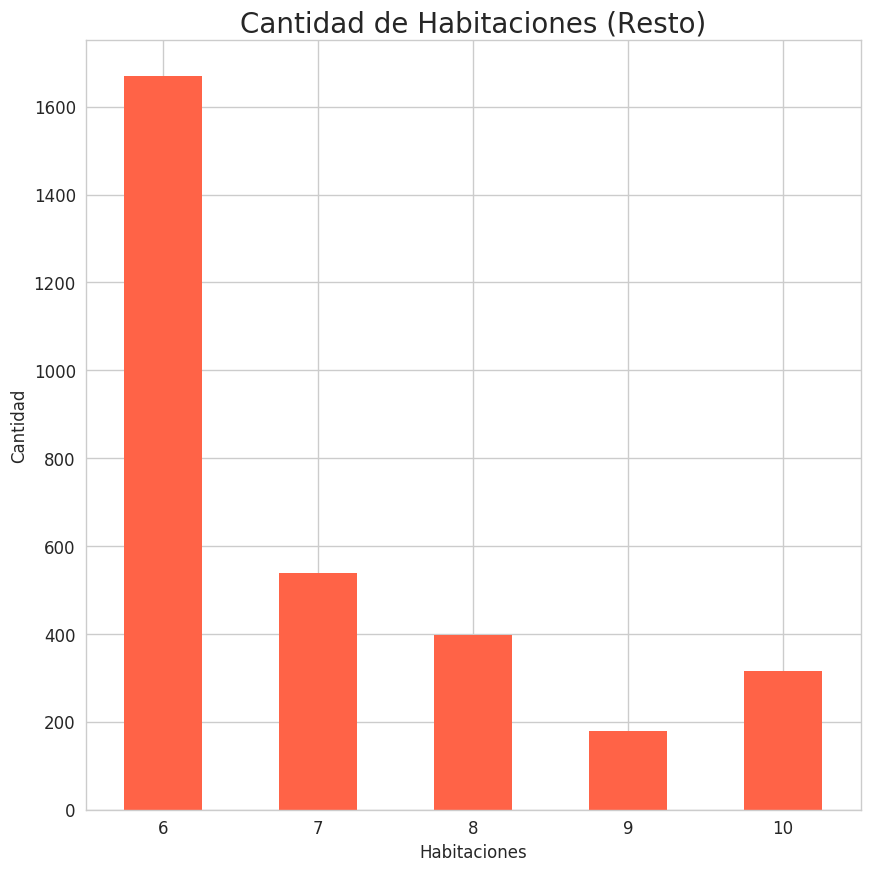

In [99]:
grafico_cantidad_habitaciones_resto=cantidad_habitaciones_resto.plot(kind='bar',color='tomato',rot=0,legend=False,fontsize=12,figsize=(10,10))
grafico_cantidad_habitaciones_resto.set_title("Cantidad de Habitaciones (Resto)",fontsize=20)
grafico_cantidad_habitaciones_resto.set_xlabel("Habitaciones",fontsize=12)
grafico_cantidad_habitaciones_resto.set_ylabel("Cantidad",fontsize=12)

In [104]:
cantidad_garages=propiedades['garages'].value_counts().sort_index().reset_index()
cantidad_garages['index']=cantidad_garages['index'].astype('int32')
cantidad_garages['garages']=cantidad_garages['garages'].astype('int32')
cantidad_garages.set_index('index',inplace=True)
cantidad_garages

,garages
index,
0,26926
1,59464
2,94167
3,21678


Text(0,0.5,'Garages')

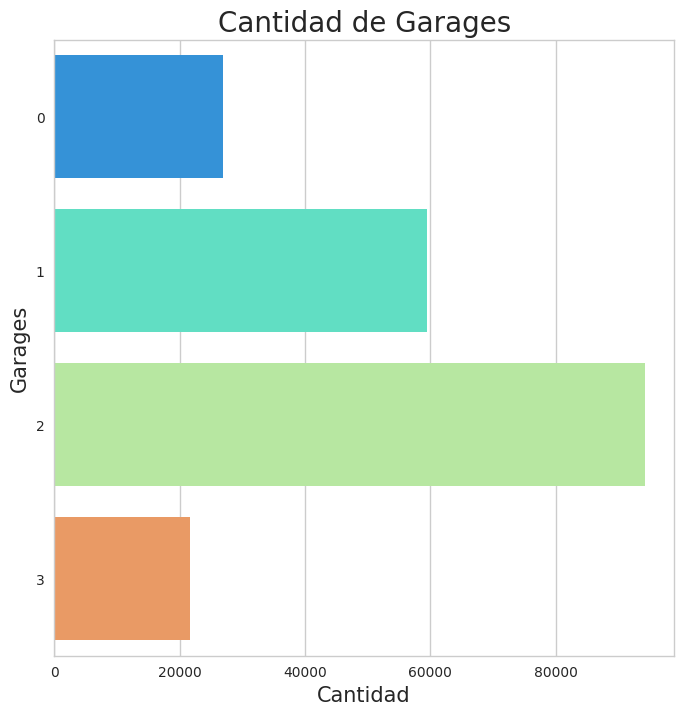

In [105]:
plt.subplots(figsize=(8,8))
grafico_cantidad_garages=sns.barplot(x=cantidad_garages['garages'],y=cantidad_garages.index,orient='h',palette='rainbow')
grafico_cantidad_garages.set_title("Cantidad de Garages",fontsize=20)
grafico_cantidad_garages.set_xlabel("Cantidad",fontsize=15)
grafico_cantidad_garages.set_ylabel("Garages",fontsize=15)

In [116]:
baño_habitacion=propiedades[['banos','habitaciones']]
baño_habitacion.dropna(inplace=True)
baño_habitacion['banos']=baño_habitacion['banos'].astype('int32')
baño_habitacion['habitaciones']=baño_habitacion['habitaciones'].astype('int32')
baño_habitacion['Valor']=1
pivot_baño_habitacion=baño_habitacion.pivot_table(index='habitaciones',columns='banos',values='Valor',aggfunc='sum')
pivot_baño_habitacion

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org

banos,1,2,3,4
habitaciones,,,,
1,4228,603,52,15
2,33764,21265,2032,216
3,17024,55740,36017,10037
4,1208,6886,8375,6058
5,189,1132,1324,996
6,41,347,453,376
7,23,79,130,125
8,19,38,71,105
9,7,21,27,35


[Text(0,0.5,'1'),
 Text(0,1.5,'2'),
 Text(0,2.5,'3'),
 Text(0,3.5,'4'),
 Text(0,4.5,'5'),
 Text(0,5.5,'6'),
 Text(0,6.5,'7'),
 Text(0,7.5,'8'),
 Text(0,8.5,'9'),
 Text(0,9.5,'10')]

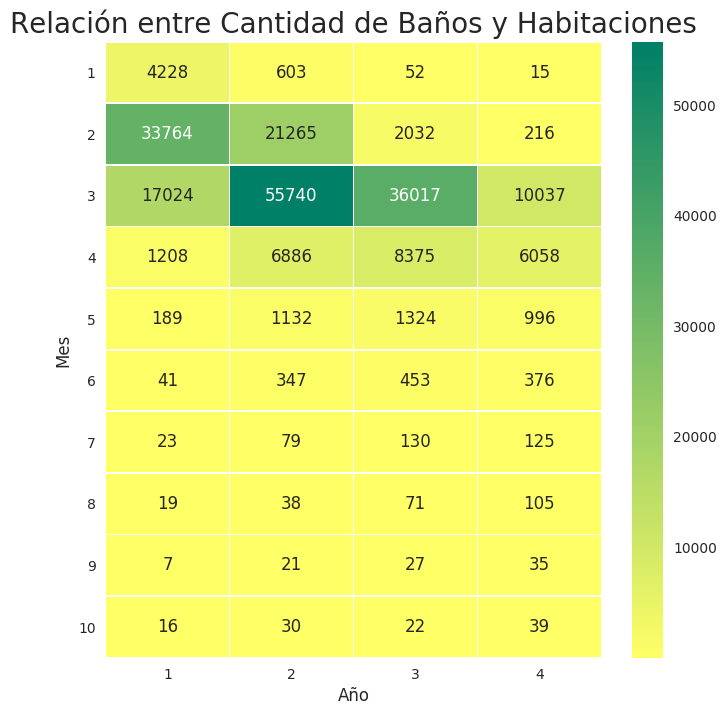

In [121]:
plt.subplots(figsize=(8,8))
grafico_baños_habitacion=sns.heatmap(pivot_baño_habitacion,linewidths=.5,fmt="d",annot=True,cmap="summer_r")
grafico_baños_habitacion.set_title("Relación entre Cantidad de Baños y Habitaciones",fontsize=20)
grafico_baños_habitacion.set_xlabel("Año",fontsize=12)
grafico_baños_habitacion.set_ylabel("Mes",fontsize=12)
grafico_baños_habitacion.set_yticklabels(grafico_baños_habitacion.get_yticklabels(),rotation=0)

In [124]:
habitaciones_precio=propiedades[['habitaciones','precio']]
habitaciones_precio.dropna(inplace=True)
habitaciones_precio['habitaciones']=habitaciones_precio['habitaciones'].astype('int32')
group_habitaciones_precio=habitaciones_precio.groupby(['habitaciones']).agg({'precio':'mean'})
group_habitaciones_precio

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,precio
habitaciones,
1,1.806075e+06
2,1.616900e+06
3,2.769607e+06
4,3.494389e+06
5,3.284972e+06
6,3.165559e+06
7,3.562564e+06
8,3.432464e+06
9,3.936174e+06


Text(0,0.5,'Precio')

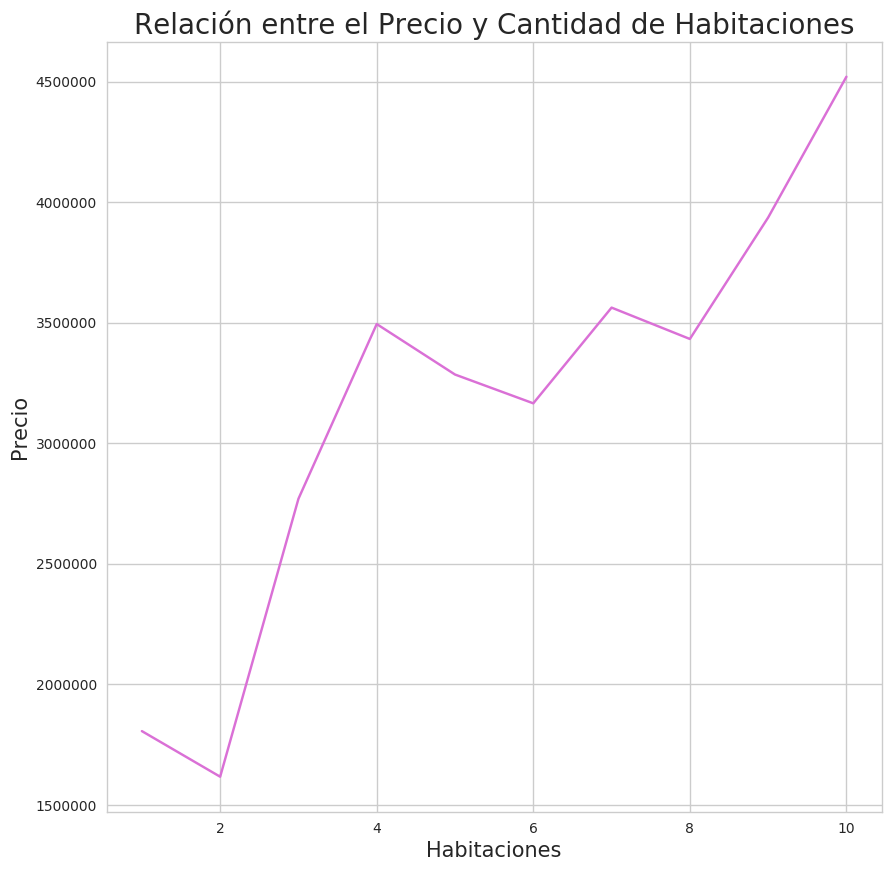

In [128]:
grafico_habitaciones_precio=group_habitaciones_precio.plot(kind='line',color='orchid',figsize=(10,10),legend=False)
grafico_habitaciones_precio.set_title("Relación entre el Precio y Cantidad de Habitaciones",fontsize=20)
grafico_habitaciones_precio.set_xlabel("Habitaciones",fontsize=15)
grafico_habitaciones_precio.set_ylabel("Precio",fontsize=15)

In [21]:
baños_precio=propiedades[['banos','precio']]
baños_precio.dropna(inplace=True)
baños_precio['banos']=baños_precio['banos'].astype('int32')
group_baños_precio=baños_precio.groupby(['banos']).agg({'precio':'mean'})
group_baños_precio

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,precio
banos,
1,1.041802e+06
2,2.317530e+06
3,3.701017e+06
4,4.449123e+06


([<matplotlib.axis.XTick at 0x7f6b330bb5f8>,
 <a list of 4 Text xticklabel objects>)

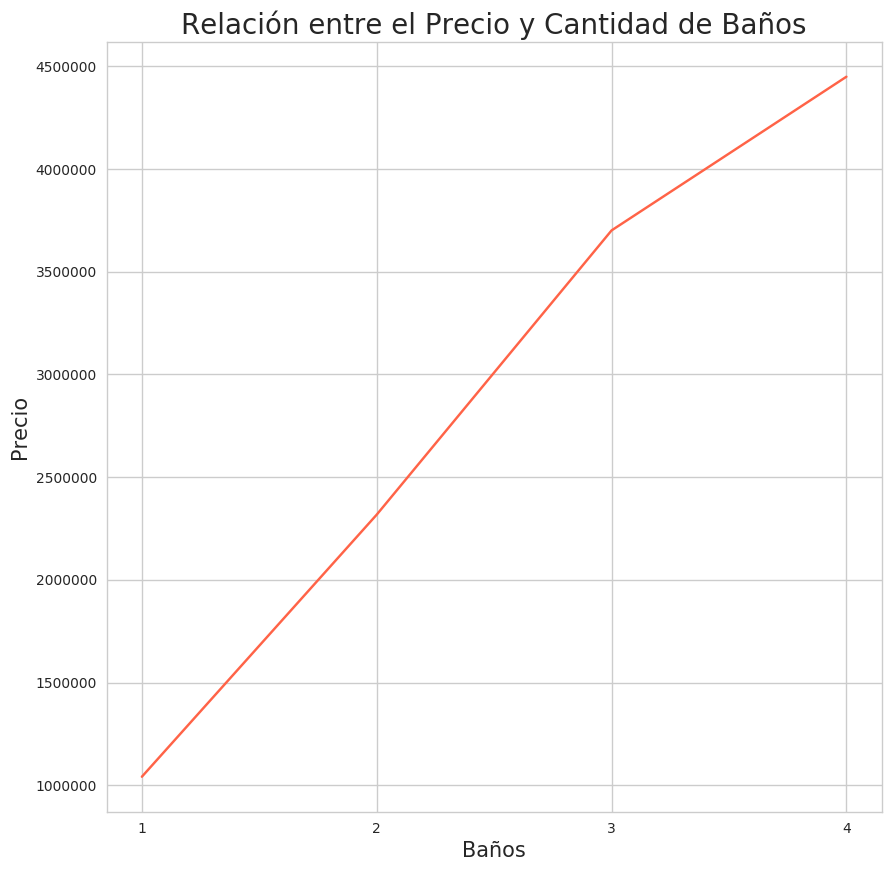

In [29]:
grafico_baños_precio=group_baños_precio.plot(kind='line',color='tomato',figsize=(10,10),legend=False)
grafico_baños_precio.set_title("Relación entre el Precio y Cantidad de Baños",fontsize=20)
grafico_baños_precio.set_xlabel("Baños",fontsize=15)
grafico_baños_precio.set_ylabel("Precio",fontsize=15)
plt.xticks([1,2,3,4])

In [25]:
garages_precio=propiedades[['garages','precio']]
garages_precio.dropna(inplace=True)
garages_precio['garages']=garages_precio['garages'].astype('int32')
group_garages_precio=garages_precio.groupby(['garages']).agg({'precio':'mean'})
group_garages_precio

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,precio
garages,
0,2.033283e+06
1,1.346328e+06
2,2.644485e+06
3,4.293016e+06


([<matplotlib.axis.XTick at 0x7f6b330e3cc0>,
 <a list of 4 Text xticklabel objects>)

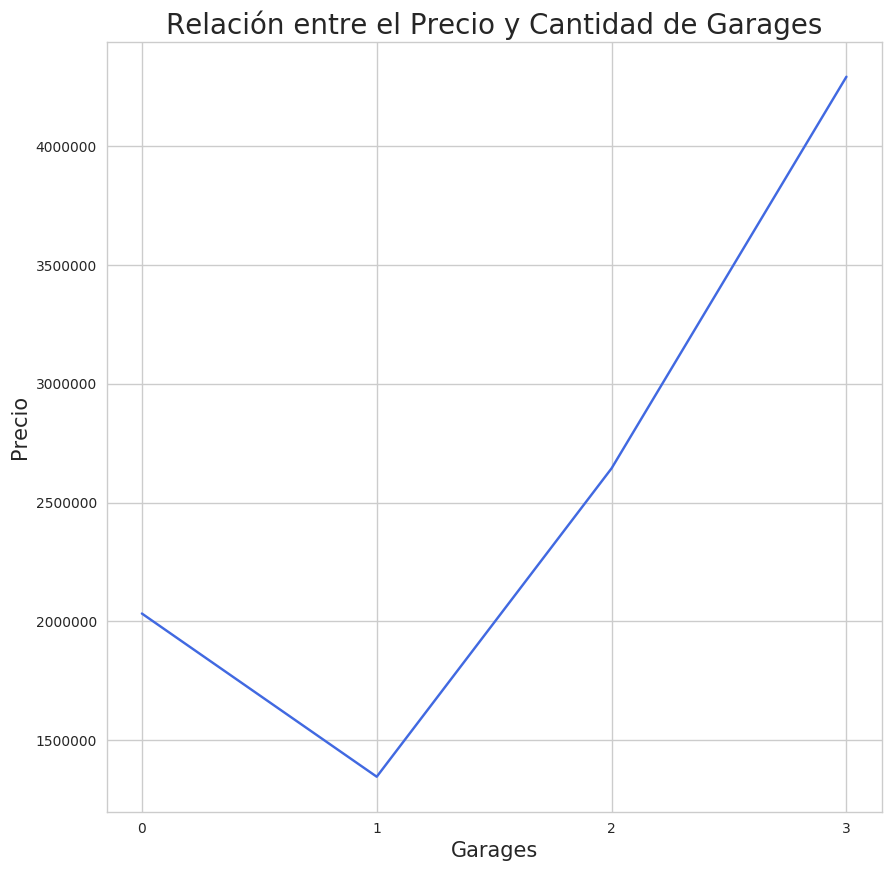

In [30]:
grafico_garages_precio=group_garages_precio.plot(kind='line',color='royalblue',figsize=(10,10),legend=False)
grafico_garages_precio.set_title("Relación entre el Precio y Cantidad de Garages",fontsize=20)
grafico_garages_precio.set_xlabel("Garages",fontsize=15)
grafico_garages_precio.set_ylabel("Precio",fontsize=15)
plt.xticks([0,1,2,3])

In [49]:
baños_hab_garages_tipo=propiedades[['tipodepropiedad','habitaciones','garages','banos']]
baños_hab_garages_tipo.dropna(inplace=True)
baños_hab_garages_tipo['Valor']=1
baños_hab_garages_tipo['Valor']=baños_hab_garages_tipo['Valor'].astype('int32')
baños_hab_garages_tipo['habitaciones']=baños_hab_garages_tipo['habitaciones'].astype('int32')
baños_hab_garages_tipo['garages']=baños_hab_garages_tipo['garages'].astype('int32')
baños_hab_garages_tipo['banos']=baños_hab_garages_tipo['banos'].astype('int32')
baños_tipo=baños_hab_garages_tipo.pivot_table(index='tipodepropiedad',columns='banos',values='Valor',aggfunc='sum')
habitaciones_tipo=baños_hab_garages_tipo.pivot_table(index='tipodepropiedad',columns='habitaciones',values='Valor',aggfunc='sum')
garages_tipo=baños_hab_garages_tipo.pivot_table(index='tipodepropiedad',columns='garages',values='Valor',aggfunc='sum')
baños_tipo.fillna(0,inplace=True)
habitaciones_tipo.fillna(0,inplace=True)
garages_tipo.fillna(0,inplace=True)

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org

In [50]:
baños_tipo

banos,1,2,3,4
tipodepropiedad,,,,
Apartamento,20086.0,23950.0,7028.0,1182.0
Bodega comercial,33.0,31.0,8.0,3.0
Casa,28047.0,45404.0,27313.0,10140.0
Casa en condominio,2855.0,6610.0,4526.0,1485.0
Casa uso de suelo,45.0,128.0,75.0,41.0
Departamento Compartido,56.0,52.0,18.0,3.0
Duplex,243.0,71.0,9.0,7.0
Edificio,34.0,19.0,35.0,20.0
Huerta,1.0,1.0,0.0,1.0


In [51]:
habitaciones_tipo

habitaciones,1,2,3,4,5,6,7,8,9,10
tipodepropiedad,,,,,,,,,,
Apartamento,2581.0,28289.0,20692.0,633.0,32.0,10.0,1.0,5.0,3.0,0.0
Bodega comercial,24.0,28.0,13.0,5.0,3.0,1.0,1.0,0.0,0.0,0.0
Casa,1185.0,20875.0,70009.0,15065.0,2515.0,805.0,226.0,130.0,37.0,57.0
Casa en condominio,135.0,2680.0,11185.0,1397.0,67.0,9.0,1.0,1.0,0.0,1.0
Casa uso de suelo,6.0,35.0,104.0,78.0,24.0,18.0,10.0,6.0,0.0,8.0
Departamento Compartido,7.0,61.0,58.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0
Duplex,8.0,194.0,105.0,10.0,7.0,6.0,0.0,0.0,0.0,0.0
Edificio,8.0,25.0,23.0,11.0,9.0,16.0,4.0,7.0,2.0,3.0
Huerta,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [52]:
garages_tipo

garages,0,1,2,3
tipodepropiedad,,,,
Apartamento,4727.0,23769.0,20657.0,3093.0
Bodega comercial,34.0,17.0,15.0,9.0
Casa,7072.0,30359.0,59680.0,13793.0
Casa en condominio,328.0,3186.0,9459.0,2503.0
Casa uso de suelo,54.0,76.0,100.0,59.0
Departamento Compartido,18.0,52.0,51.0,8.0
Duplex,26.0,226.0,68.0,10.0
Edificio,45.0,25.0,22.0,16.0
Huerta,3.0,0.0,0.0,0.0


[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Departamento Compartido'),
 Text(0,6.5,'Duplex'),
 Text(0,7.5,'Edificio'),
 Text(0,8.5,'Huerta'),
 Text(0,9.5,'Inmuebles productivos urbanos'),
 Text(0,10.5,'Local Comercial'),
 Text(0,11.5,'Local en centro comercial'),
 Text(0,12.5,'Nave industrial'),
 Text(0,13.5,'Oficina comercial'),
 Text(0,14.5,'Otros'),
 Text(0,15.5,'Quinta Vacacional'),
 Text(0,16.5,'Rancho'),
 Text(0,17.5,'Terreno'),
 Text(0,18.5,'Terreno comercial'),
 Text(0,19.5,'Terreno industrial'),
 Text(0,20.5,'Villa')]

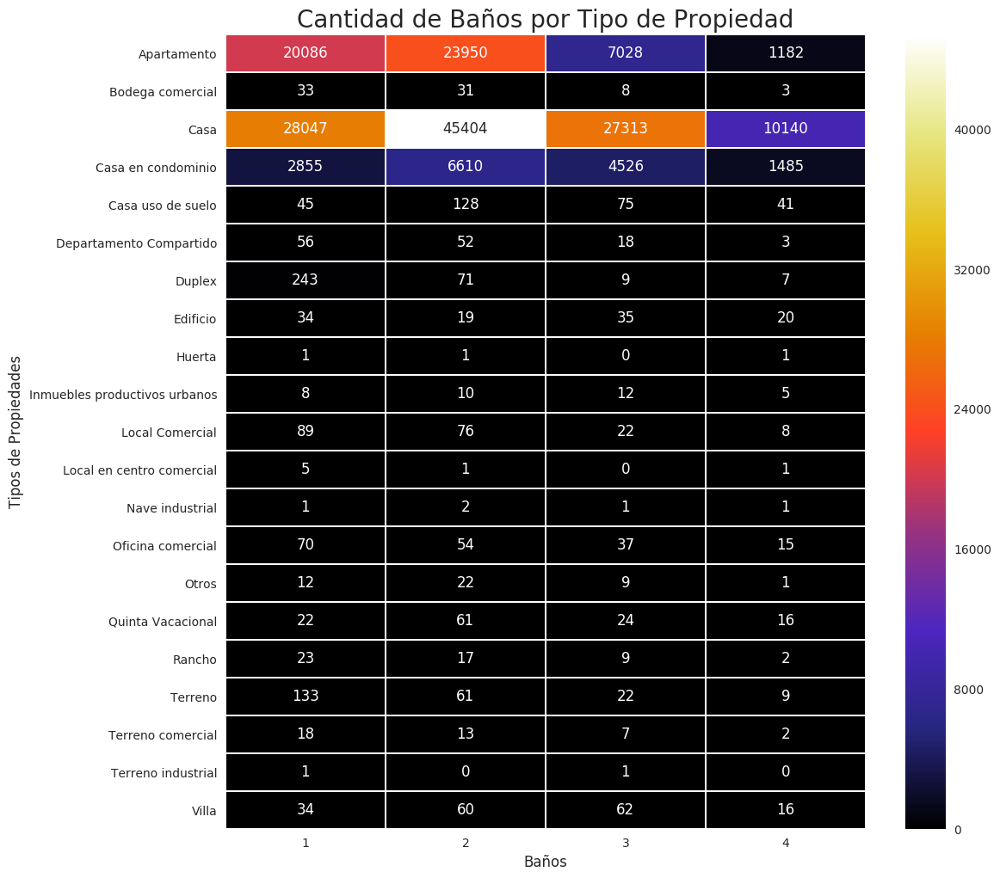

In [61]:
plt.subplots(figsize=(12,12))
grafico_baño_tipo=sns.heatmap(baños_tipo,linewidths=.5,fmt=".0f",annot=True,cmap="CMRmap")
grafico_baño_tipo.set_title("Cantidad de Baños por Tipo de Propiedad",fontsize=20)
grafico_baño_tipo.set_xlabel("Baños",fontsize=12)
grafico_baño_tipo.set_ylabel("Tipos de Propiedades",fontsize=12)
grafico_baño_tipo.set_yticklabels(grafico_baño_tipo.get_yticklabels(),rotation=0)

[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Departamento Compartido'),
 Text(0,6.5,'Duplex'),
 Text(0,7.5,'Edificio'),
 Text(0,8.5,'Huerta'),
 Text(0,9.5,'Inmuebles productivos urbanos'),
 Text(0,10.5,'Local Comercial'),
 Text(0,11.5,'Local en centro comercial'),
 Text(0,12.5,'Nave industrial'),
 Text(0,13.5,'Oficina comercial'),
 Text(0,14.5,'Otros'),
 Text(0,15.5,'Quinta Vacacional'),
 Text(0,16.5,'Rancho'),
 Text(0,17.5,'Terreno'),
 Text(0,18.5,'Terreno comercial'),
 Text(0,19.5,'Terreno industrial'),
 Text(0,20.5,'Villa')]

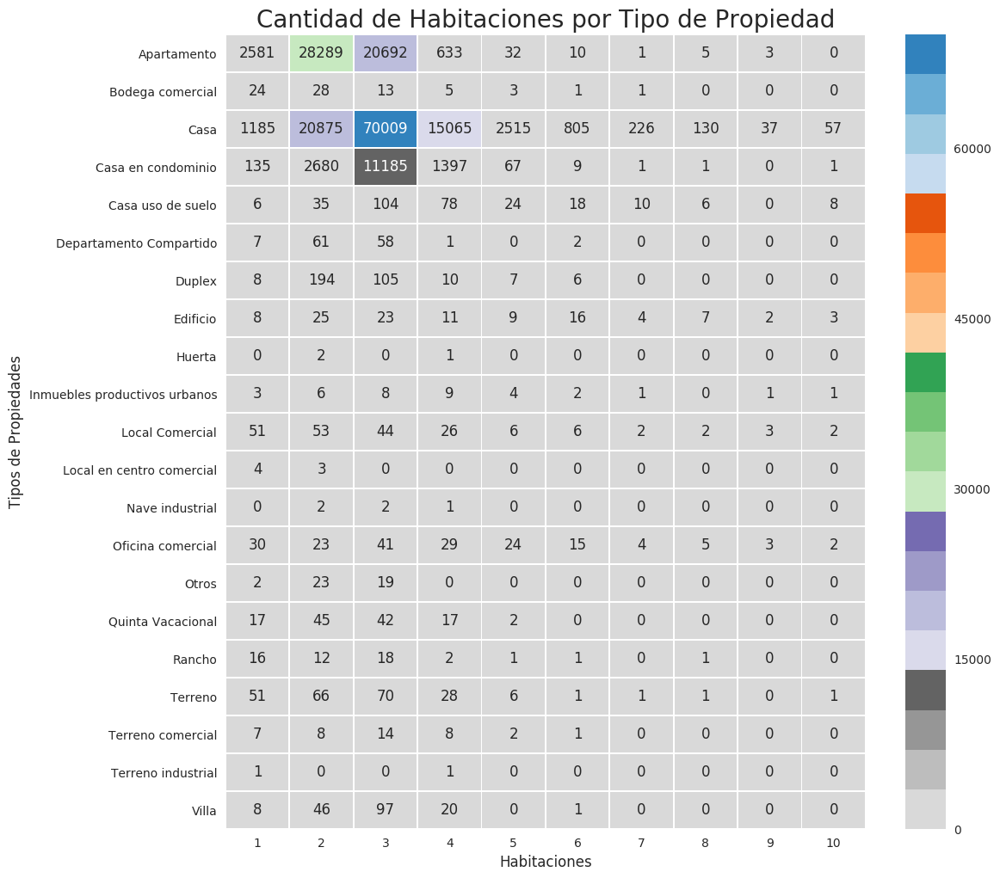

In [68]:
plt.subplots(figsize=(12,12))
grafico_habitaciones_tipo=sns.heatmap(habitaciones_tipo,linewidths=.5,fmt=".0f",annot=True,cmap="tab20c_r")
grafico_habitaciones_tipo.set_title("Cantidad de Habitaciones por Tipo de Propiedad",fontsize=20)
grafico_habitaciones_tipo.set_xlabel("Habitaciones",fontsize=12)
grafico_habitaciones_tipo.set_ylabel("Tipos de Propiedades",fontsize=12)
grafico_habitaciones_tipo.set_yticklabels(grafico_baño_tipo.get_yticklabels(),rotation=0)

[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Departamento Compartido'),
 Text(0,6.5,'Duplex'),
 Text(0,7.5,'Edificio'),
 Text(0,8.5,'Huerta'),
 Text(0,9.5,'Inmuebles productivos urbanos'),
 Text(0,10.5,'Local Comercial'),
 Text(0,11.5,'Local en centro comercial'),
 Text(0,12.5,'Nave industrial'),
 Text(0,13.5,'Oficina comercial'),
 Text(0,14.5,'Otros'),
 Text(0,15.5,'Quinta Vacacional'),
 Text(0,16.5,'Rancho'),
 Text(0,17.5,'Terreno'),
 Text(0,18.5,'Terreno comercial'),
 Text(0,19.5,'Terreno industrial'),
 Text(0,20.5,'Villa')]

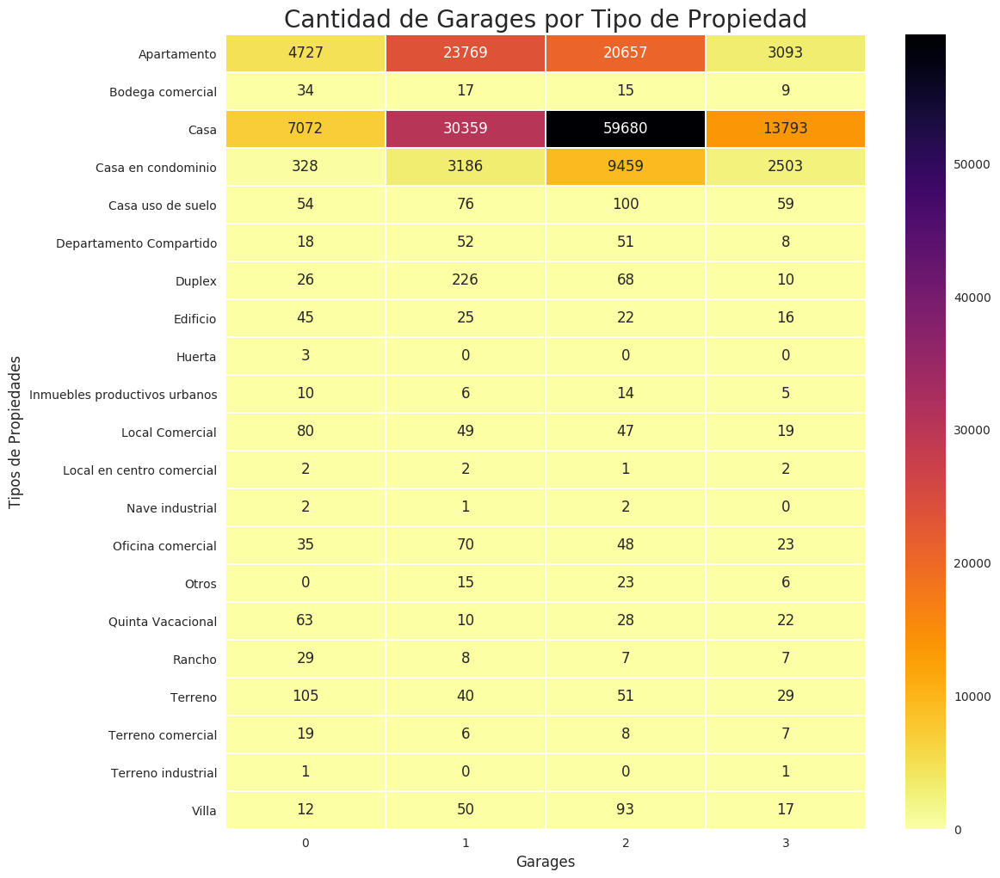

In [70]:
plt.subplots(figsize=(12,12))
grafico_garages_tipo=sns.heatmap(garages_tipo,linewidths=.5,fmt=".0f",annot=True,cmap="inferno_r")
grafico_garages_tipo.set_title("Cantidad de Garages por Tipo de Propiedad",fontsize=20)
grafico_garages_tipo.set_xlabel("Garages",fontsize=12)
grafico_garages_tipo.set_ylabel("Tipos de Propiedades",fontsize=12)
grafico_garages_tipo.set_yticklabels(grafico_baño_tipo.get_yticklabels(),rotation=0)

In [74]:
def garagesABool(garage):
    if (garage==0.0):
        return False
    if (garage!=0.0):
        return True

In [91]:
lat_lng_garage=propiedades[['lat','lng','garages']]
lat_lng_garage.dropna(inplace=True)
lat_lng_garage['hay_garage']=lat_lng_garage['garages'].apply(garagesABool)
lat_lng_haygarage=lat_lng_garage[(lat_lng_garage['hay_garage']==True)]
lat_lng_haygarage.head()

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,lat,lng,garages,hay_garage
1,19.310205,-99.227655,2.0,True
3,19.301890,-99.688015,1.0,True
5,19.300612,-99.148475,1.0,True
6,17.143504,-96.803504,1.0,True
7,20.672612,-87.037968,2.0,True


In [92]:
geometry = [Point(xy) for xy in zip(lat_lng_haygarage['lng'], lat_lng_haygarage['lat'])]
coordenadas_haygarage = gpd.GeoDataFrame(lat_lng_haygarage, geometry=geometry)   

In [93]:
coordenadas_haygarage.head()

,lat,lng,garages,hay_garage,geometry
1,19.310205,-99.227655,2.0,True,POINT (-99.2276548 19.3102045)
3,19.301890,-99.688015,1.0,True,POINT (-99.6880151 19.3018899)
5,19.300612,-99.148475,1.0,True,POINT (-99.14847480000005 19.300612)
6,17.143504,-96.803504,1.0,True,POINT (-96.80350437680001 17.1435035135)
7,20.672612,-87.037968,2.0,True,POINT (-87.0379684 20.6726121)


In [99]:
filtrado_haygarage=coordenadas_haygarage[(coordenadas_haygarage['lat']<=lat_maxima) & (coordenadas_haygarage['lat']>=lat_minima) & (coordenadas_haygarage['lng']<=lng_maxima) & (coordenadas_haygarage['lng']>=lng_minima)]

Text(0.5,1,'Distribución de Propiedades con Garage por Estado')

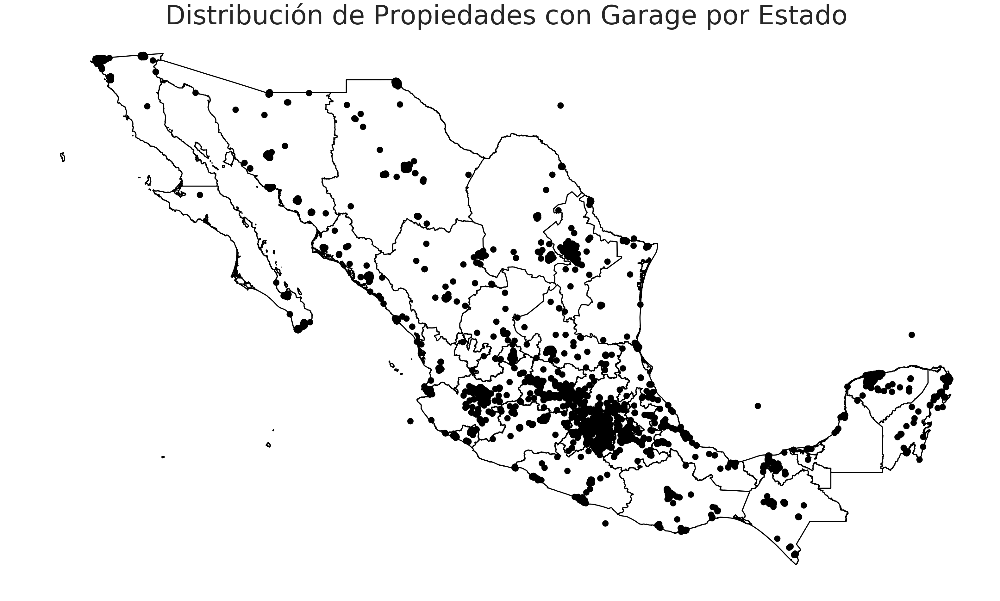

In [100]:
ax=mex.plot(color='white',edgecolor='black',figsize=(40,40),linewidth=2.5)
ax.axis('off')
grafico_haygarage=filtrado_haygarage.plot(column='hay_garage',cmap=ListedColormap('black'),ax=ax,markersize=200)
grafico_haygarage.set_title("Distribución de Propiedades con Garage por Estado",fontsize=60)

In [80]:
direccion=propiedades[['provincia','tipodepropiedad','direccion']]
direccion.dropna(inplace=True)
direccion['avenida']=direccion.direccion.str.contains('AV|av|Avenida|avenida')
direccion.head()

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,provincia,tipodepropiedad,direccion,avenida
0,Distrito Federal,Apartamento,Avenida Division del Norte 2005,True
1,Distrito Federal,Casa en condominio,AV. MEXICO,True
2,Jalisco,Casa,Urbi Tonala,False
3,Edo. de México,Casa,IGNACIO MANUEL ALTAMIRANO 128,False
4,Jalisco,Apartamento,PASEOS DEL SOL,False


In [81]:
cantidad_direcciones_avenida=direccion['avenida'].value_counts().reset_index()
cantidad_direcciones_avenida.replace({False:'NO',True:'SI'},inplace=True)
cantidad_direcciones_avenida.set_index('index',inplace=True)
cantidad_direcciones_avenida

,avenida
index,
NO,174344
SI,12515


Text(0,0.5,'¿Es Avenida?')

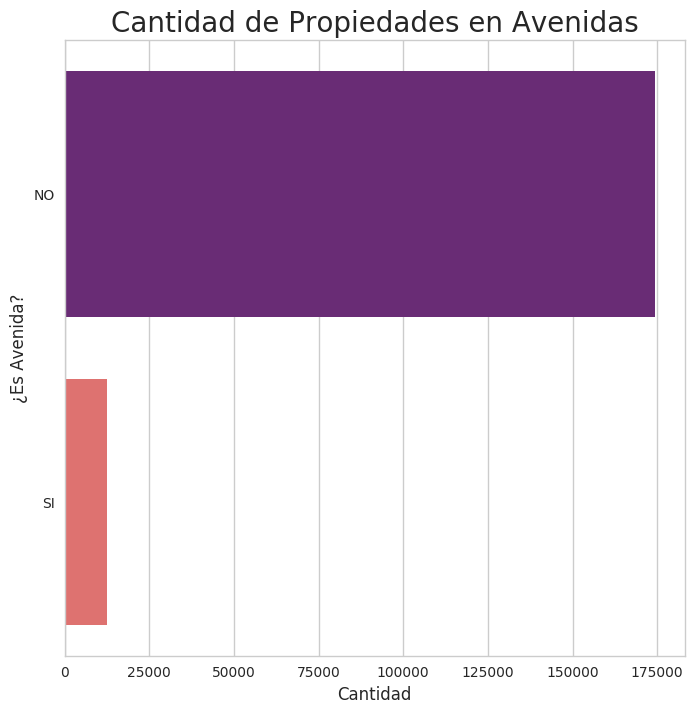

In [82]:
plt.subplots(figsize=(8,8))
grafico_avenida=sns.barplot(x=cantidad_direcciones_avenida['avenida'],y=cantidad_direcciones_avenida.index,orient='h',palette='magma')
grafico_avenida.set_title("Cantidad de Propiedades en Avenidas",fontsize=20)
grafico_avenida.set_xlabel("Cantidad",fontsize=12)
grafico_avenida.set_ylabel("¿Es Avenida?",fontsize=12)

In [83]:
propiedades_avenida=direccion[(direccion['avenida']==True)]
propiedades_avenida.head()

,provincia,tipodepropiedad,direccion,avenida
0,Distrito Federal,Apartamento,Avenida Division del Norte 2005,True
1,Distrito Federal,Casa en condominio,AV. MEXICO,True
8,Colima,Apartamento,BUENAVISTA DEPTOS CON SUBSIDIO,True
69,Edo. de México,Casa,Flavius,True
104,Puebla,Casa,AV 15 DE MAYO 4732,True


In [84]:
tipo_avenida=propiedades_avenida['tipodepropiedad'].value_counts().head(8)
tipo_avenida

Casa                  6170
Apartamento           4097
Casa en condominio    1071
Terreno                423
Local Comercial        255
Oficina comercial      138
Edificio                92
Bodega comercial        67
Name: tipodepropiedad, dtype: int64

Text(0,0.5,'Tipo de Propiedad')

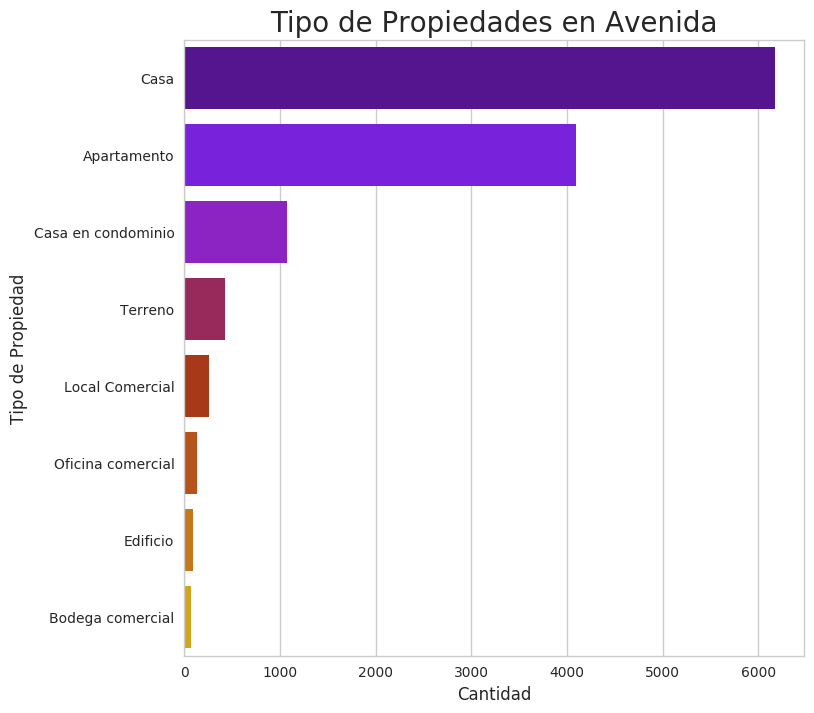

In [85]:
plt.subplots(figsize=(8,8))
grafico_tipo_avenida=sns.barplot(x=tipo_avenida.values,y=tipo_avenida.index,orient='h',palette='gnuplot')
grafico_tipo_avenida.set_title("Tipo de Propiedades en Avenida",fontsize=20)
grafico_tipo_avenida.set_xlabel("Cantidad",fontsize=12)
grafico_tipo_avenida.set_ylabel("Tipo de Propiedad",fontsize=12)

In [86]:
cantidad_provincia_avenida=propiedades_avenida['provincia'].value_counts().reset_index()
cantidad_provincia_avenida.rename(columns={'index':'provincia','provincia':'cantidad'},inplace=True)
cantidad_provincia_avenida

,provincia,cantidad
0,Distrito Federal,3927
1,Edo. de México,2690
2,Jalisco,1569
3,Morelos,582
4,Querétaro,502
5,Puebla,442
6,Nuevo León,400
7,Quintana Roo,386
8,San luis Potosí,262
9,Baja California Norte,205


In [87]:
provincia_avenida=pd.merge(mex,cantidad_provincia_avenida,on='provincia',how='left')
provincia_avenida.head()

,id,country,name,enname,provincia,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,note,rpath,ISO3166_2,geometry,cantidad
0,2610002,MEX,Aguascalientes,Aguascalientes,Aguascalientes,None,administrative,4,Q79952,es:Aguascalientes,2018-09-14 05:12:23,None,"2610002,114686,0",MX-AGU,"POLYGON ((-102.8741765 21.852771, -102.8728254...",76
1,2589601,MEX,Baja California,Baja California,Baja California Norte,Estado de Baja California Norte,administrative,4,Q58731,es:Baja California,2018-09-14 05:12:24,None,"2589601,114686,0",MX-BCN,"(POLYGON ((-118.3648719 29.1463582, -118.36449...",205
2,2568834,MEX,Campeche,Campeche,Campeche,None,administrative,4,Q80908,es:Campeche,2018-09-14 05:12:24,None,"2568834,114686,0",MX-CAM,"(POLYGON ((-91.18573000000001 18.9576998, -91....",11
3,2556679,MEX,Chiapas,Chiapas,Chiapas,Estado de Chiapas,administrative,4,Q60123,es:Chiapas,2018-09-14 05:12:24,None,"2556679,114686,0",MX-CHP,(POLYGON ((-94.03396083806574 16.0214346310621...,72
4,1673425,MEX,Chihuahua,Chihuahua,Chihuahua,None,administrative,4,Q655,es:Chihuahua,2018-09-14 05:12:23,None,"1673425,114686,0",MX-CHH,"POLYGON ((-109.0749842 28.2724889, -109.070872...",88


Text(0.5,1,'Cantidad de Propiedades sobre Avenidas por Estado')

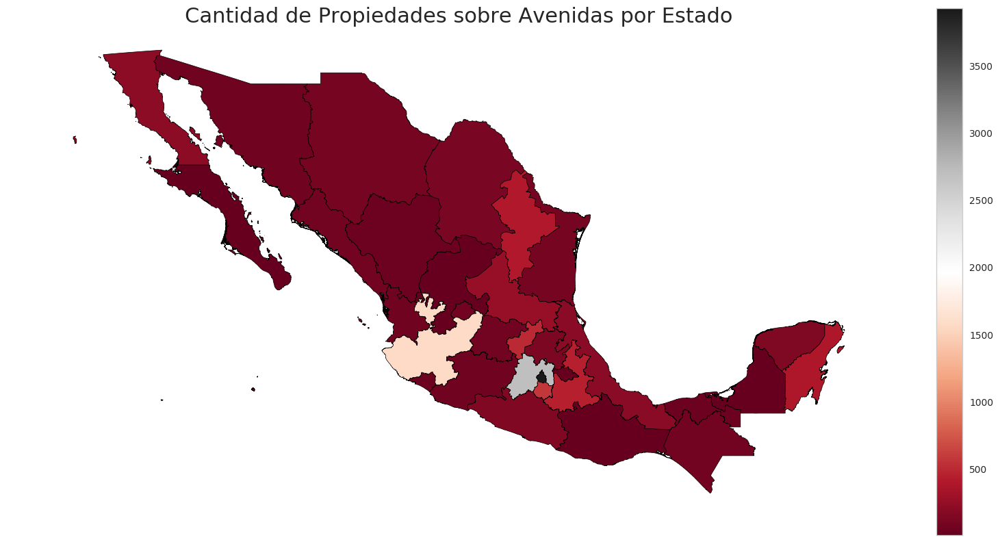

In [88]:
fig, grafico_provincia_avenida = plt.subplots(1, figsize=(20, 10))
provincia_avenida.plot(column='cantidad',cmap='RdGy', edgecolor='black',ax=grafico_provincia_avenida,legend=True,figsize=(30,30),linewidth=0.5)
grafico_provincia_avenida.axis('off')
grafico_provincia_avenida.set_title("Cantidad de Propiedades sobre Avenidas por Estado",fontsize=22)

In [95]:
tipo_propiedad_top

,tipodepropiedad
0,Casa
1,Apartamento
2,Casa en condominio
3,Terreno
4,Local Comercial
5,Oficina comercial
6,Bodega comercial
7,Edificio
8,Terreno comercial
9,Casa uso de suelo


In [113]:
año_tipo=propiedades[['Anio','tipodepropiedad','Estacion']]
año_tipo.dropna(inplace=True)
año_tipo_top=pd.merge(año_tipo,tipo_propiedad_top,on='tipodepropiedad',how='inner')
año_tipo_top['Valor']=1
año_tipo_top.head()

/home/sergio/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Anio,tipodepropiedad,Estacion,Valor
0,2015,Apartamento,Verano,1
1,2016,Apartamento,Primavera,1
2,2014,Apartamento,Invierno,1
3,2014,Apartamento,Invierno,1
4,2014,Apartamento,Otonio,1


[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Edificio'),
 Text(0,6.5,'Local Comercial'),
 Text(0,7.5,'Oficina comercial'),
 Text(0,8.5,'Terreno'),
 Text(0,9.5,'Terreno comercial')]

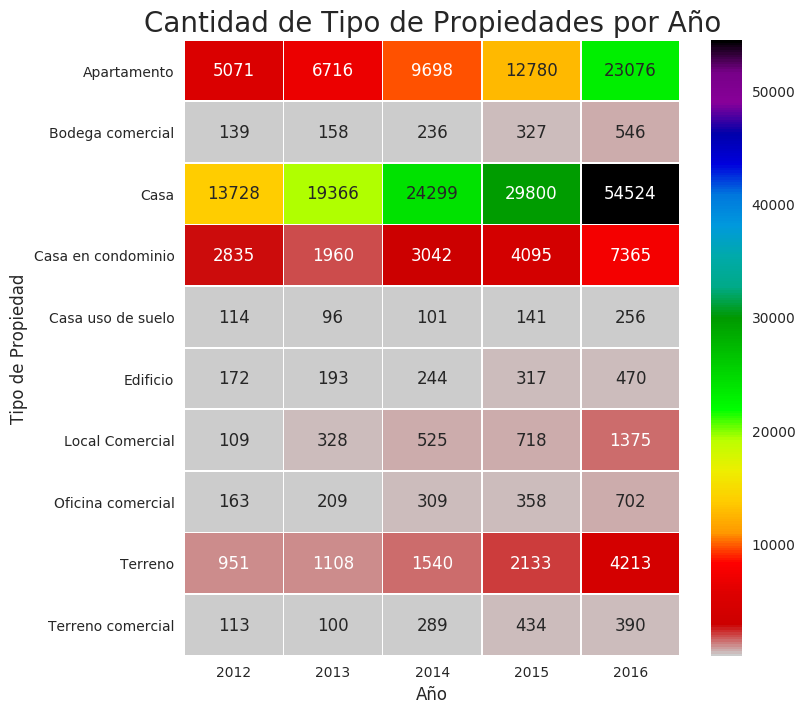

In [114]:
cantidad_año_tipo_top=año_tipo_top.pivot_table(index='tipodepropiedad',columns='Anio',values='Valor',aggfunc='sum')
plt.subplots(figsize=(8,8))
grafico_cantidad_año_tipo_top=sns.heatmap(cantidad_año_tipo_top,linewidths=.5,fmt="d",annot=True,cmap="nipy_spectral_r")
grafico_cantidad_año_tipo_top.set_title("Cantidad de Tipo de Propiedades por Año",fontsize=20)
grafico_cantidad_año_tipo_top.set_xlabel("Año",fontsize=12)
grafico_cantidad_año_tipo_top.set_ylabel("Tipo de Propiedad",fontsize=12)
grafico_cantidad_año_tipo_top.set_yticklabels(grafico_cantidad_año_tipo_top.get_yticklabels(),rotation=0)

[Text(0,0.5,'Apartamento'),
 Text(0,1.5,'Bodega comercial'),
 Text(0,2.5,'Casa'),
 Text(0,3.5,'Casa en condominio'),
 Text(0,4.5,'Casa uso de suelo'),
 Text(0,5.5,'Edificio'),
 Text(0,6.5,'Local Comercial'),
 Text(0,7.5,'Oficina comercial'),
 Text(0,8.5,'Terreno'),
 Text(0,9.5,'Terreno comercial')]

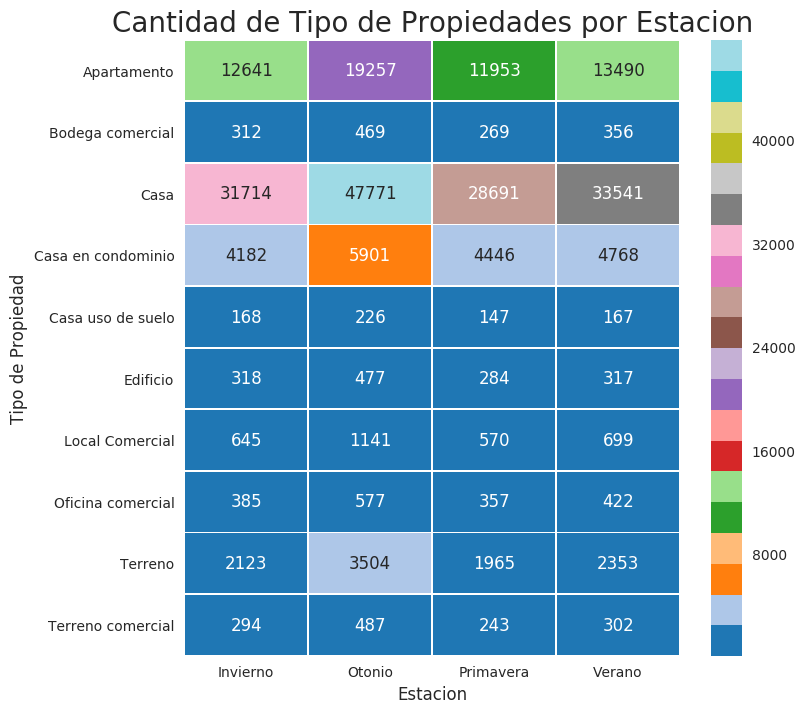

In [121]:
cantidad_estacion_tipo_top=año_tipo_top.pivot_table(index='tipodepropiedad',columns='Estacion',values='Valor',aggfunc='sum')
plt.subplots(figsize=(8,8))
grafico_cantidad_estacion_tipo_top=sns.heatmap(cantidad_estacion_tipo_top,linewidths=.5,fmt="d",annot=True,cmap="tab20")
grafico_cantidad_estacion_tipo_top.set_title("Cantidad de Tipo de Propiedades por Estacion",fontsize=20)
grafico_cantidad_estacion_tipo_top.set_xlabel("Estacion",fontsize=12)
grafico_cantidad_estacion_tipo_top.set_ylabel("Tipo de Propiedad",fontsize=12)
grafico_cantidad_estacion_tipo_top.set_yticklabels(grafico_cantidad_estacion_tipo_top.get_yticklabels(),rotation=0)